<a href="https://colab.research.google.com/github/mtofighi/ChilwaBasin/blob/main/ChilwaBasin_ClimateDailyAnalysis_032024/ChilwaClimateDailyTempRainAnalysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# <span style="color:orange">**Chilwa Basin Climate Data Analysis**</span>

# **1. Rainfall**

## **1.1. Daily Rainfall Data and Analysis**

### 1.1.1. Getting the Data of Daily Rainfall

The code loads a dataset from an Excel file hosted on GitHub. It converts the index of the dataset to datetime format and extracts the year and month information. The resulting dataset is then indexed by 'Year' and 'Month'. Finally, the code displays the data types of the columns and the shape of the dataset.

Here I read data from my GitHub account.

In [2]:
import pandas as pd
import matplotlib.pyplot as plt

url = 'https://github.com/mtofighi/ChilwaBasin/blob/main/ChilwaBasin_ClimateDailyAnalysis_032024/Data/ChilwaBasin_Rainfall_19812018.xlsx?raw=true'

dataRain = pd.read_excel(url)

# Convert the index to datetime format (assuming the index is in a date format)
dataRain.index = pd.to_datetime(dataRain.iloc[:, 0])

# Extract year and month from the index
dataRain['Year'] = dataRain.index.year
dataRain['Month'] = dataRain.index.month

# Set the columns 'Year' and 'Month' as the index
dataRain.set_index(['Year', 'Month'], inplace=True)

# Check the type of dataset
print("Data types:", dataRain.dtypes)

# Check the shape of the data
print("Data shape:", dataRain.shape)

# Convert the column names to an array
headers = dataRain.columns.to_numpy()

# Print the headers array
print("Headers:", headers)

Data types: Date         datetime64[ns]
Chanco              float64
Chingale            float64
Makoka              float64
Naminjiwa           float64
Ntaja               float64
Zomba_RTC           float64
Chimpeni            float64
Average             float64
dtype: object
Data shape: (13879, 9)
Headers: ['Date' 'Chanco' 'Chingale' 'Makoka' 'Naminjiwa' 'Ntaja' 'Zomba_RTC'
 'Chimpeni' 'Average']


### 1.1.2. Analyzing Missing Values of Daily Rainfall

#### 1.1.2.1. Analysis of Missing Values in Dataset of Daily Rainfall: Identification, Removal, and Visualization

The code performs an analysis of missing values in a dataset. It calculates the number and percentage of missing values for each column, sorts them in descending order based on the missing percentage, and prints the information. The missing values information is then saved as an Excel file.

Next, the code drops rows that contain any missing values (NaN) from the dataset and displays the rows with all values present. The rows with complete data are saved as an Excel file.

The code also generates a bar plot to visualize the missing values, with variables on the x-axis and the corresponding missing percentage on the y-axis. The plot is saved as a high-quality JPG file and displayed.

Overall, the code provides insights into the missing values in the dataset, presents the rows with complete data, and visualizes the missing values distribution.


Missing Values:
           Missing Values  Missing Percentage
Date                    0                 0.0
Chanco                  0                 0.0
Chingale                0                 0.0
Makoka                  0                 0.0
Naminjiwa               0                 0.0
Ntaja                   0                 0.0
Zomba_RTC               0                 0.0
Chimpeni                0                 0.0
Average                 0                 0.0

Rows with all values present:
                 Date  Chanco  Chingale  Makoka  Naminjiwa  Ntaja  Zomba_RTC  \
Year Month                                                                     
1981 1     1981-01-01    22.2      18.1    23.1       31.6    5.9        0.0   
     1     1981-01-02     0.0       0.0     2.5        7.2   13.0        0.0   
     1     1981-01-03     0.0       0.0     1.0        0.0    0.0        0.0   
     1     1981-01-04     0.0       0.0     0.0        0.0    0.0        0.0   
     1     1

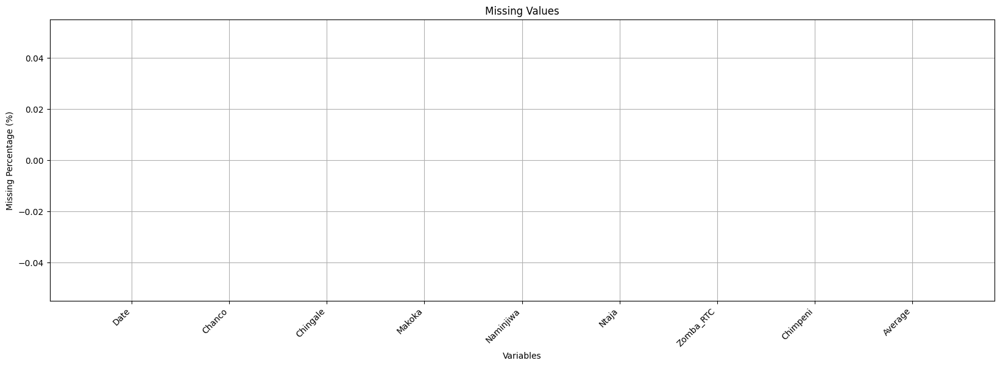

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# Folder path containing the results
results_folder_path = '/content/DailyRainfall/'

# Create the folder if it does not exist
if not os.path.exists(results_folder_path):
    os.makedirs(results_folder_path)

# Check for missing values
missing_values = dataRain.isnull().sum()
missing_percentage = (missing_values / len(dataRain)) * 100

# Sort columns based on missing percentage
missing_df = pd.DataFrame({'Missing Values': missing_values, 'Missing Percentage': missing_percentage})
missing_df = missing_df.sort_values(by='Missing Percentage', ascending=False)

# Print the missing values information
print("\nMissing Values:")
print(missing_df)

# Save the missing values information as an Excel file
missing_values_file_path = os.path.join(results_folder_path, "DailyRainfall_missing_values.xlsx")
missing_df.to_excel(missing_values_file_path)

# Drop rows with any missing values (NaN)
non_nan_rows = dataRain.dropna()

# Display the rows with all values present
print("\nRows with all values present:")
print(non_nan_rows.head(5))

# Save the rows with all values present as an Excel file
non_nan_rows_file_path = os.path.join(results_folder_path, "DailyRainfall_non_nan_rows.xlsx")
non_nan_rows.to_excel(non_nan_rows_file_path)

# Plotting the missing values
plt.figure(figsize=(20, 6))
plt.bar(missing_df.index, missing_df['Missing Percentage'])
plt.xlabel('Variables')
plt.ylabel('Missing Percentage (%)')
plt.title('Missing Values')
plt.xticks(rotation=45, ha='right')
plt.grid(True)

# Save the plot as a high-quality JPG file
missing_values_plot_jpg_path = os.path.join(results_folder_path, 'DailyRainfall_missing_values_plot.jpg')
plt.savefig(missing_values_plot_jpg_path, dpi=300, bbox_inches='tight')

# Save the plot as a high-quality PNG file
missing_values_plot_png_path = os.path.join(results_folder_path, 'DailyRainfall_missing_values_plot.png')
plt.savefig(missing_values_plot_png_path, dpi=300, bbox_inches='tight')

# Display the plot
plt.show()

#### 1.1.2.2. Visualizing Missing Values with Heatmap of Daily Rainfall

This code generates a heatmap to visualize the missing values in a dataset using the seaborn library. It excludes the first column of the dataset, assuming it contains non-date values. The heatmap represents missing values as colored cells, with missing values shown as blank spaces. The plot is customized by rotating the x and y-axis labels, adding a title and axis labels, and including grid lines. The resulting plot is saved as a high-quality JPG file. This code provides a quick and visual overview of the missing values distribution in the dataset.

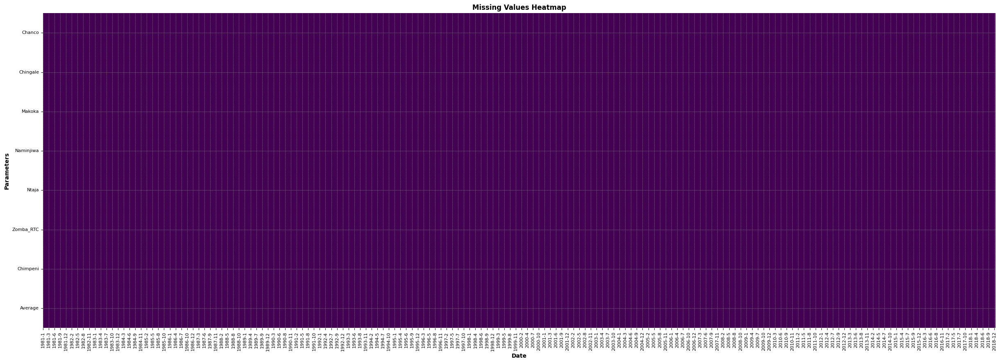

In [4]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os

# Folder path containing the results
results_folder_path = '/content/DailyRainfall/'

# Create the folder if it does not exist
if not os.path.exists(results_folder_path):
    os.makedirs(results_folder_path)

# Exclude the first column (assuming it contains non-date values)
data_without_dates = dataRain.iloc[:, 1:]

# Create the heatmap
plt.figure(figsize=(30, 10))
sns.heatmap(data_without_dates.isnull().transpose(), cmap='viridis', cbar=False)

# Customize the plot
plt.xticks(rotation=90, fontsize=8)
plt.yticks(rotation=0, fontsize=8)
plt.title('Missing Values Heatmap', fontweight='bold')
plt.xlabel('Date', fontweight='bold')
plt.ylabel('Parameters', fontweight='bold')

# Add grid lines
plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray')

# Save the plot in high-quality JPG format
missing_values_heatmap_jpg_path = os.path.join(results_folder_path, 'DailyRainfall_missing_values_heatmap.jpg')
plt.savefig(missing_values_heatmap_jpg_path, dpi=300, bbox_inches='tight')

plt.show()

#### 1.1.2.3. Analyzing Start and End Dates for Columns with Missing Values of Daily Rainfall

This code analyzes the start and end dates of columns in a dataset that have missing values. It retrieves the start and end dates for each column, calculates the duration in months and years, and generates a table with the column name, start date, end date, years of data, and months of data. The table is printed and saved as an Excel file.

In [5]:
import pandas as pd
from tabulate import tabulate
from datetime import datetime
import os

# Folder path containing the results
results_folder_path = '/content/DailyRainfall/'

# Create the folder if it does not exist
if not os.path.exists(results_folder_path):
    os.makedirs(results_folder_path)

# The dataset is called 'data'
start_dates = {}
end_dates = {}
months_data = {}
years_data = {}

for column in dataRain.columns:
    not_missing_mask = dataRain[column].notna()  # Boolean mask where True indicates a non-missing value
    not_missing_data = dataRain.loc[not_missing_mask]  # Subset of data with no missing values

    if not_missing_data.empty:
        continue

    start_date = not_missing_data.iloc[0, 0]  # Value at the first row and first column
    end_date = not_missing_data.iloc[-1, 0]  # Value at the last row and first column

    start_dates[column] = start_date
    end_dates[column] = end_date
    months_data[column] = (end_date.year - start_date.year) * 12 + (end_date.month - start_date.month) + 1
    years_data[column] = end_date.year - start_date.year + 1

# Prepare the data for tabulation
table_data = []
for column, start_date in start_dates.items():
    end_date = end_dates[column]
    # Format dates to remove hour and day
    start_date = datetime.strftime(start_date, "%Y-%m")
    end_date = datetime.strftime(end_date, "%Y-%m")
    table_data.append([column, start_date, end_date, years_data[column], months_data[column]])

# Sort the table based on the number of missing data (ascending order)
table_data.sort(key=lambda x: dataRain[x[0]].isnull().sum())

# Generate the table
table_headers = ["Column", "Start Date", "End Date", "Years Data", "Months Data"]
table = tabulate(table_data, headers=table_headers, tablefmt="pipe")

# Print the table
print(table)

# Save the table as an Excel file
start_end_dates_excel_path = os.path.join(results_folder_path, 'DailyRainfall_start_end_dates_sorted.xlsx')
df = pd.DataFrame(table_data, columns=table_headers)
df.to_excel(start_end_dates_excel_path, index=False)

| Column    | Start Date   | End Date   |   Years Data |   Months Data |
|:----------|:-------------|:-----------|-------------:|--------------:|
| Date      | 1981-01      | 2018-12    |           38 |           456 |
| Chanco    | 1981-01      | 2018-12    |           38 |           456 |
| Chingale  | 1981-01      | 2018-12    |           38 |           456 |
| Makoka    | 1981-01      | 2018-12    |           38 |           456 |
| Naminjiwa | 1981-01      | 2018-12    |           38 |           456 |
| Ntaja     | 1981-01      | 2018-12    |           38 |           456 |
| Zomba_RTC | 1981-01      | 2018-12    |           38 |           456 |
| Chimpeni  | 1981-01      | 2018-12    |           38 |           456 |
| Average   | 1981-01      | 2018-12    |           38 |           456 |


In [6]:
import pandas as pd
import os

# Folder path containing the results
results_folder_path = '/content/DailyRainfall/'

# Create the folder if it does not exist
if not os.path.exists(results_folder_path):
    os.makedirs(results_folder_path)

# Identify and print the exact date and column for missing data
missing_data_output = []

for column in dataRain.columns:
    missing_rows = dataRain[dataRain[column].isnull()]
    if not missing_rows.empty:
        for index, row in missing_rows.iterrows():
            date_str = '-'.join(map(str, index))  # Combine the multi-index as a string
            date = pd.to_datetime(date_str)  # Convert the string to a pandas Timestamp
            missing_data_output.append(f"Missing data on date: {date.strftime('%m/%d/%Y')} in column: {column}")

# Save the output to a text file
missing_data_output_file_path = os.path.join(results_folder_path, 'DailyRainfall_missing_data.txt')
with open(missing_data_output_file_path, 'w') as f:
    for line in missing_data_output:
        f.write("%s\n" % line)

# Display the output
for line in missing_data_output:
    print(line)

### 1.1.3.  Visualizing the Correlation of Daily Rainfall

The heatmap visualizes the correlations between numerical features in the dataset, with bold and legible correlation values. The plot is saved as high-quality JPG and PNG images, and the correlation matrix is exported to an Excel file. This allows for easy identification of feature relationships and patterns in the data.

**Pearson Correlation Coefficient:**

Pearson correlation is the most widely used method for measuring the linear correlation between two continuous variables.
It assumes that the variables are normally distributed and the relationship between them is linear.
The values of Pearson correlation range from -1 to 1, where -1 indicates a perfect negative linear correlation, 1 indicates a perfect positive linear correlation, and 0 indicates no linear correlation.

**Spearman Rank Correlation:**
Spearman correlation is a non-parametric measure of rank correlation between two variables.
It does not assume a linear relationship and is suitable for both continuous and ordinal variables.
It calculates the correlation based on the ranks of the data rather than the raw data values.
Spearman correlation is robust to outliers and is useful when the data is not normally distributed.

**Kendall's Tau Correlation:**
Kendall's Tau is another non-parametric measure of rank correlation, similar to Spearman correlation.
It measures the similarity in the order of ranks between two variables.
Like Spearman correlation, Kendall's Tau is suitable for both continuous and ordinal variables and is robust to outliers.

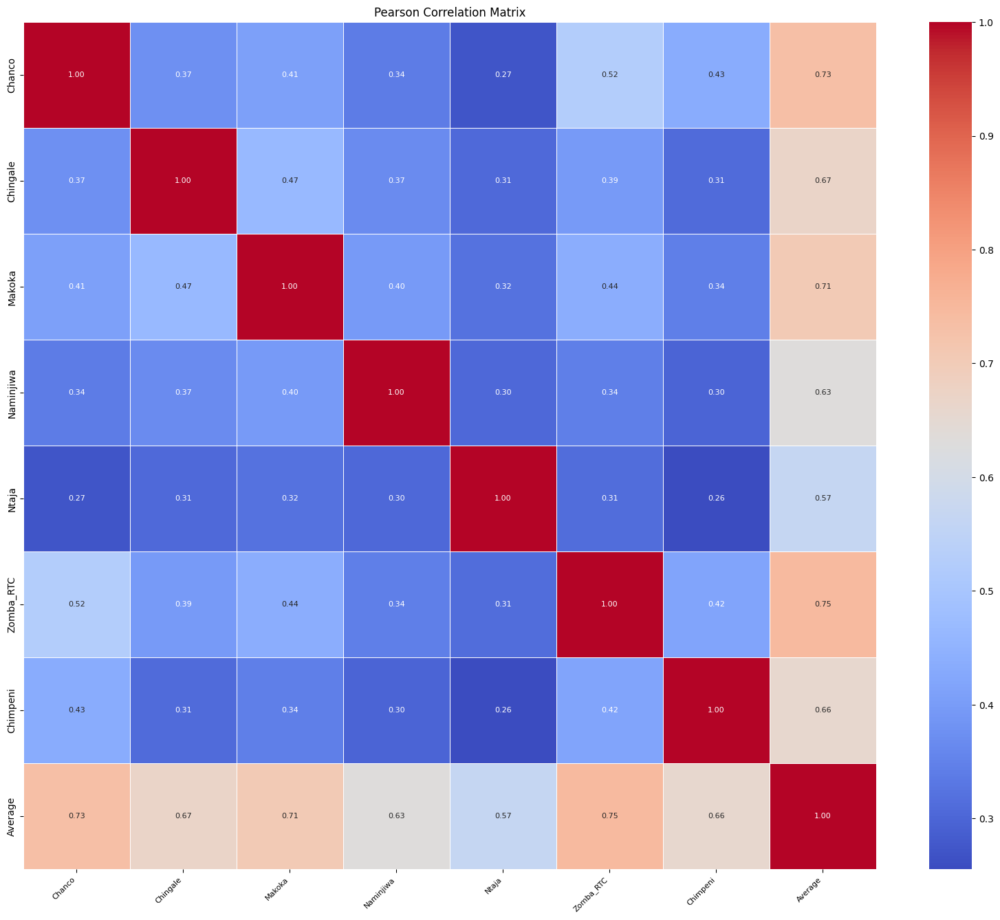

Plot saved to: /content/DailyRainfall/DailyRainfall_pearson_correlation_matrix_plot_20240424_213250.jpg
Excel file saved to: /content/DailyRainfall/DailyRainfall_pearson_correlation_matrix_20240424_213250.xlsx


In [7]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime
import os

# Folder path containing the results
results_folder_path = '/content/DailyRainfall/'

# Create the folder if it does not exist
if not os.path.exists(results_folder_path):
    os.makedirs(results_folder_path)

# Assuming your DataFrame is named 'data'
selected_features = ['Chanco', 'Chingale', 'Makoka', 'Naminjiwa', 'Ntaja', 'Zomba_RTC', 'Chimpeni','Average']

# Filter the DataFrame to include only the selected features
data_selected_features = dataRain[selected_features]

# Calculate Pearson Correlation
correlation_matrix_pearson = data_selected_features.corr()

# Set the figure size and annotation font size
plt.figure(figsize=(20, 16))

# Plot the Pearson Correlation Matrix
sns.heatmap(correlation_matrix_pearson, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 8}, linewidths=0.5)
plt.title('Pearson Correlation Matrix', fontsize=12)

# Rotate the feature names on the x-axis
plt.xticks(rotation=45, ha='right', fontsize=8)

# Get the current timestamp
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

# Save the plot in high-quality JPG format with a timestamp in the file name
plot_file_path_jpg = os.path.join(results_folder_path, f'DailyRainfall_pearson_correlation_matrix_plot_{timestamp}.jpg')
plt.savefig(plot_file_path_jpg, dpi=300, bbox_inches='tight')

# Save the Pearson correlation matrix as an Excel file with a timestamp in the file name
excel_file_path = os.path.join(results_folder_path, f'DailyRainfall_pearson_correlation_matrix_{timestamp}.xlsx')
correlation_matrix_pearson.to_excel(excel_file_path)

# Show the plot
plt.show()

# Display the file paths
print("Plot saved to:", plot_file_path_jpg)
print("Excel file saved to:", excel_file_path)

### 1.1.4. Saving  the Correlation of Daily Rainfall
This code processes rainfal data, filters it based on a specific date range and desired columns, calculates the correlation matrix, saves it as an Excel file, and generates a correlation heatmap plot. The plot is saved as high-quality PNG and JPG files. Finally, the correlation matrix is displayed.

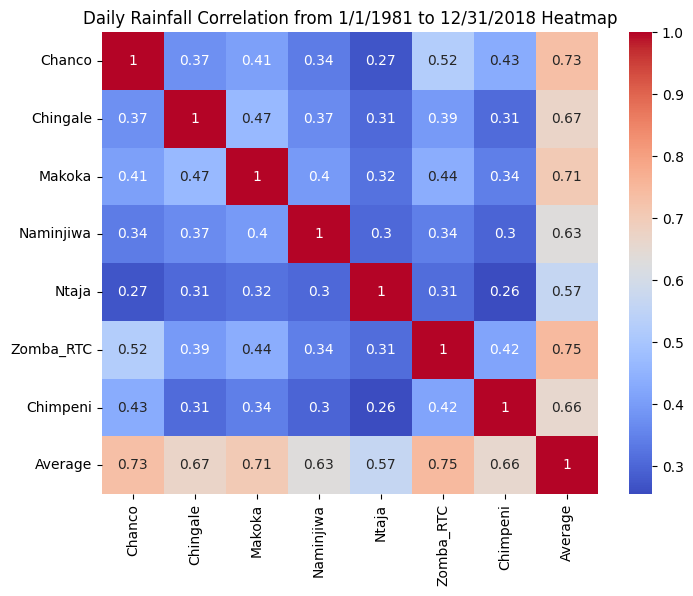

             Chanco  Chingale    Makoka  Naminjiwa     Ntaja  Zomba_RTC  \
Chanco     1.000000  0.374648  0.408954   0.336921  0.271656   0.524210   
Chingale   0.374648  1.000000  0.466715   0.368770  0.305590   0.394975   
Makoka     0.408954  0.466715  1.000000   0.395757  0.319405   0.436643   
Naminjiwa  0.336921  0.368770  0.395757   1.000000  0.302334   0.343091   
Ntaja      0.271656  0.305590  0.319405   0.302334  1.000000   0.312020   
Zomba_RTC  0.524210  0.394975  0.436643   0.343091  0.312020   1.000000   
Chimpeni   0.434219  0.309117  0.344382   0.297497  0.255343   0.415972   
Average    0.734019  0.669372  0.706138   0.631908  0.566108   0.745502   

           Chimpeni   Average  
Chanco     0.434219  0.734019  
Chingale   0.309117  0.669372  
Makoka     0.344382  0.706138  
Naminjiwa  0.297497  0.631908  
Ntaja      0.255343  0.566108  
Zomba_RTC  0.415972  0.745502  
Chimpeni   1.000000  0.657014  
Average    0.657014  1.000000  
Excel file saved to: /content/DailyR

In [10]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os

# Folder path containing the results
results_folder_path = '/content/DailyRainfall/'

# Create the folder if it does not exist
if not os.path.exists(results_folder_path):
    os.makedirs(results_folder_path)

# Assuming your DataFrame is named 'data'
selected_features = ['Chanco', 'Chingale', 'Makoka', 'Naminjiwa', 'Ntaja', 'Zomba_RTC', 'Chimpeni','Average']

# Filter the DataFrame to include only the selected features
data_selected_features = dataRain[selected_features]

# Calculate Pearson Correlation
rainfall_1_correlation_matrix = data_selected_features.corr()

# Save the correlation matrix as an Excel file
excel_file_path = os.path.join(results_folder_path, 'DailyRainfall_rainfall_1_correlation_matrix.xlsx')
rainfall_1_correlation_matrix.to_excel(excel_file_path)

# Create a correlation heatmap plot
plt.figure(figsize=(8, 6))
sns.heatmap(rainfall_1_correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Daily Rainfall Correlation from 1/1/1981 to 12/31/2018 Heatmap')

# Get the current timestamp
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

# Save the plot in high-quality JPG format with a timestamp in the file name
plot_file_path_jpg = os.path.join(results_folder_path, f'DailyRainfall_rainfall_1_correlation_plot_{timestamp}.jpg')
plt.savefig(plot_file_path_jpg, dpi=300, bbox_inches='tight')

# Display the plot
plt.show()

# Display the correlation matrix
print(rainfall_1_correlation_matrix)

# Display the file paths
print("Excel file saved to:", excel_file_path)
print("JPG plot saved to:", plot_file_path_jpg)

### 1.1.5. Chart and Pairplot of Daily Rainfall

**Can we assume that the rainfall of one station represents the rainfall for the entire basin?**

We have data available for the Makoka station as well as the average satellite data for the entire basin obtained from the Google Earth Engine.

This code processes **rainfall** data, filters it based on a specific date range and desired columns, saves a sub-dataset as an Excel file, and generates line and pair plots. The plots are saved as high-quality PNG and JPG files.

**Rainfall start_date = '1/1/1981' end_date = '12/31/2018'**

Data types:
 Chanco       float64
Chingale     float64
Makoka       float64
Naminjiwa    float64
Ntaja        float64
Zomba_RTC    float64
Chimpeni     float64
Average      float64
dtype: object

Data shape: (13879, 8)


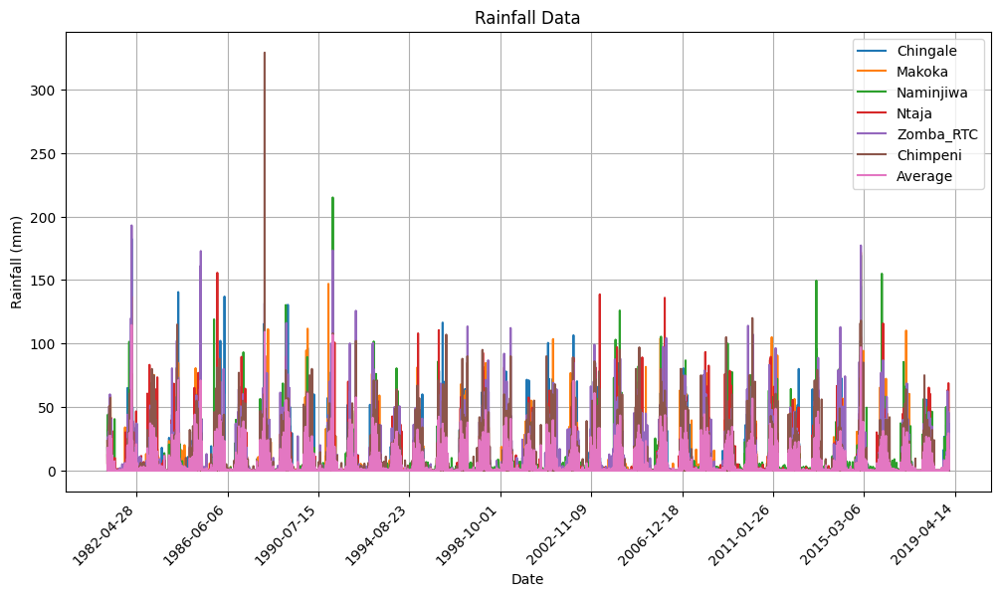

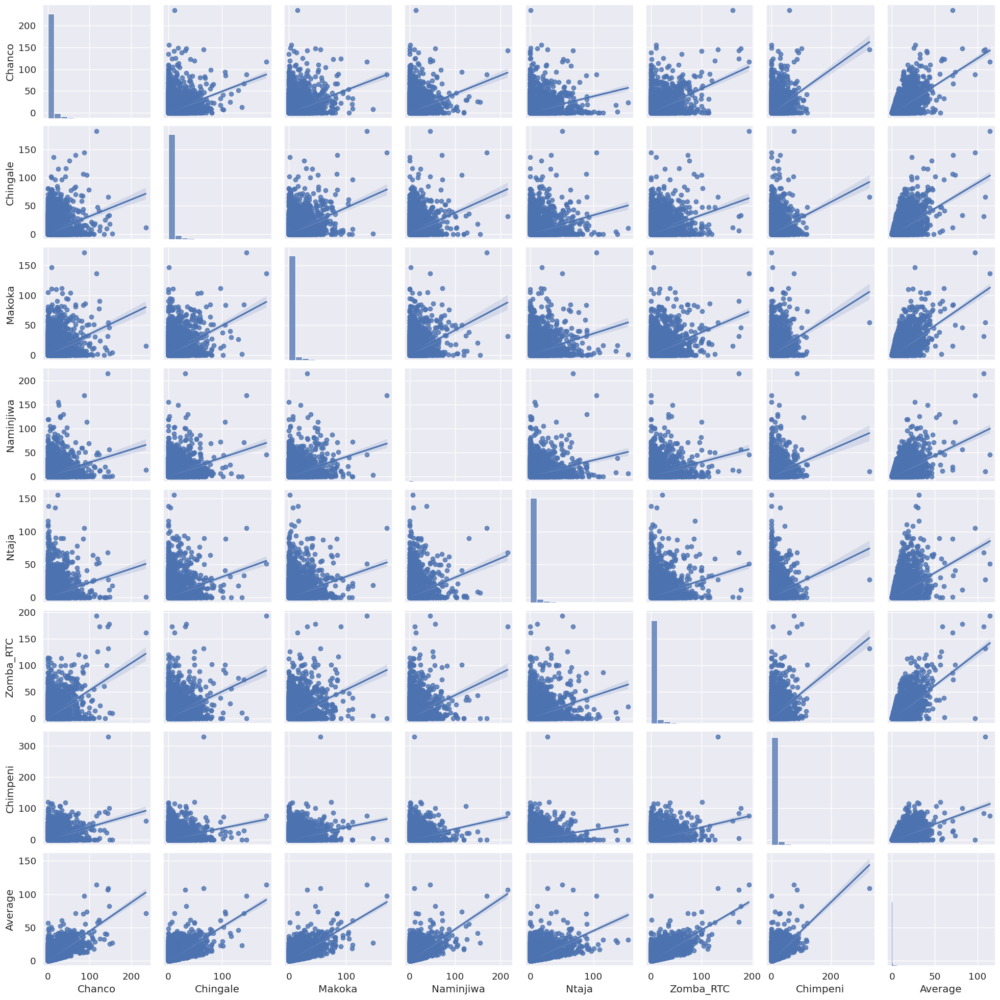

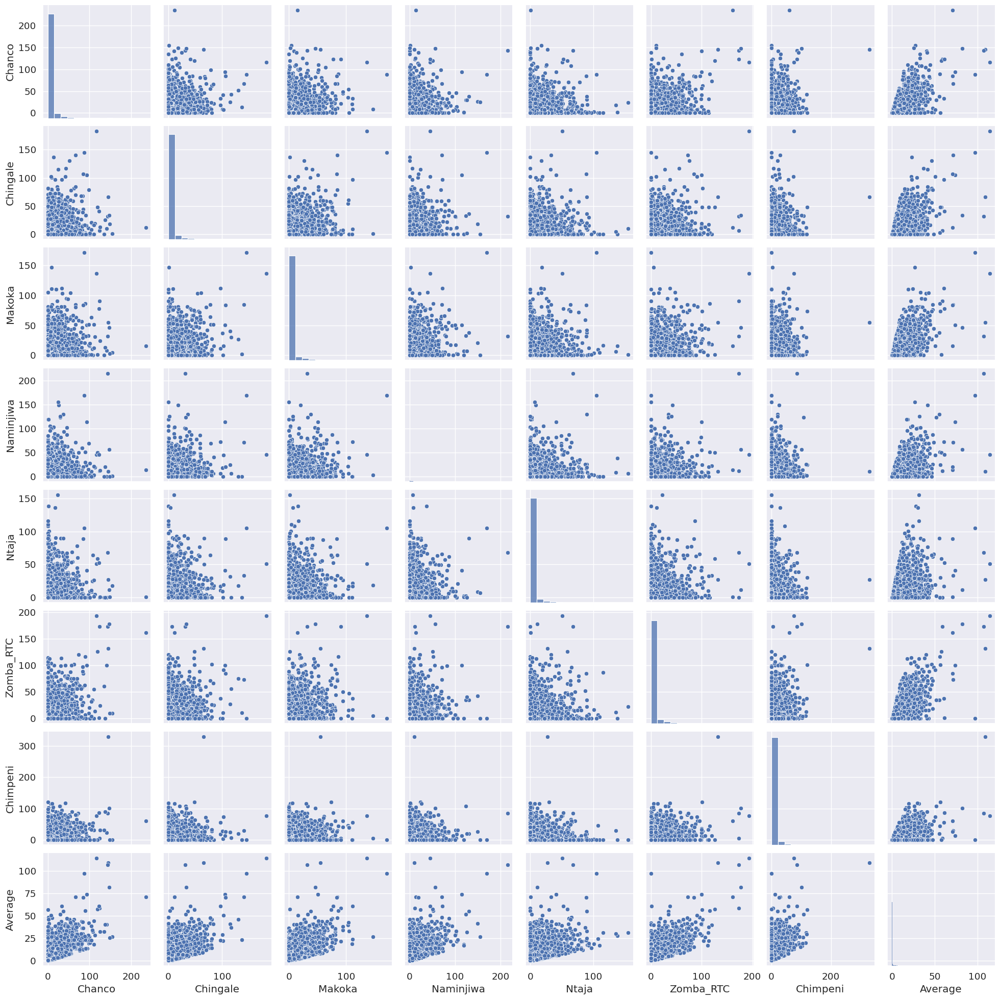

In [11]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os

# Folder path containing the results
results_folder_path = '/content/DailyRainfall/'

# Create the folder if it does not exist
if not os.path.exists(results_folder_path):
    os.makedirs(results_folder_path)

# Assuming 'dataRain' is defined and contains the dataset
sub_dataset_rainfall_1 = dataRain

# Convert 'Date' column to datetime type
sub_dataset_rainfall_1['Date'] = pd.to_datetime(sub_dataset_rainfall_1['Date'])

# Set 'Date' column as the index
sub_dataset_rainfall_1.set_index('Date', inplace=True)

# Check the type of dataset
print("Data types:\n", sub_dataset_rainfall_1.dtypes)

# Check the shape of the data
print("\nData shape:", sub_dataset_rainfall_1.shape)

# Save the subdataset as an Excel file
excel_file_path = os.path.join(results_folder_path, 'DailyRainfall_sub_dataset_rainfall_1.xlsx')
sub_dataset_rainfall_1.to_excel(excel_file_path, index=True)

# Plotting the dataset
plt.figure(figsize=(12, 6))
column_names = sub_dataset_rainfall_1.columns.tolist()
for i, column in enumerate(column_names[1:]):
    sns.lineplot(data=sub_dataset_rainfall_1[column], label=column)  # Use the column as the data

plt.xlabel('Date')
plt.ylabel('Rainfall (mm)')
plt.title('Rainfall Data')
plt.legend()

# Add grid lines
plt.grid(True)

# Set ticks on months
plt.gca().xaxis.set_major_locator(plt.MaxNLocator(12))

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

# Save the plot as a high-quality JPG file
plot_file_path = os.path.join(results_folder_path, 'DailyRainfall_rainfall_plot_1.jpg')
plt.savefig(plot_file_path, dpi=300, bbox_inches='tight')

# Display the plot
plt.show()

# Create a pair plot with regression
sns.set(font_scale=1.2)  # Increase the font size for better legibility
pairplot_reg = sns.pairplot(sub_dataset_rainfall_1, kind="reg")
pairplot_reg.savefig(os.path.join(results_folder_path, 'DailyRainfall_sub_dataset_rainfall_1_pairplot_reg.jpg'), dpi=300, bbox_inches='tight')

# Create a pair plot without regression
sns.set(font_scale=1.2)  # Increase the font size for better legibility
pairplot_scatter = sns.pairplot(sub_dataset_rainfall_1, kind="scatter")
pairplot_scatter.savefig(os.path.join(results_folder_path, 'DailyRainfall_sub_dataset_rainfall_1_pairplot_scatter.jpg'), dpi=300, bbox_inches='tight')

**Rainfall start_date = '1/1/1981' end_date = '12/31/2018' (monthly)**

## **1.2. Monthly Rainfall Data from Daily Data**

### 1.2.1. Getting the Data of Daily Rainfall

In [ ]:
import pandas as pd

url = 'https://github.com/mtofighi/ChilwaBasin/blob/main/ChilwaBasin_ClimateDailyAnalysis_032024/Data/ChilwaBasin_Rainfall_19812018.xlsx?raw=true'
dataRainMonthly = pd.read_excel(url)

# Convert the index to datetime format (assuming the index is in a date format)
dataRainMonthly.index = pd.to_datetime(dataRainMonthly.iloc[:, 0])

# Assuming your current dataset is named 'data'
# Convert the 'Date' column to datetime type if it's not already
dataRainMonthly['Date'] = pd.to_datetime(dataRainMonthly['Date'])

# Set 'Date' column as the index
dataRainMonthly.set_index('Date', inplace=True)

# Resample the data to monthly frequency, taking the first day of each month
monthlyRainfall_data = dataRainMonthly.resample('MS').agg({'Chanco': 'sum', 'Chingale': 'sum', 'Makoka': 'sum', 'Naminjiwa': 'sum',
                                       'Ntaja': 'sum', 'Zomba_RTC': 'sum', 'Chimpeni': 'sum', 'Average': 'sum'})

# Reset the index to have a default integer index
monthlyRainfall_data.reset_index(inplace=True)

# Format the 'Date' column as 2/1/2000
monthlyRainfall_data['Date'] = monthlyRainfall_data['Date'].dt.strftime('%m/%d/%Y')

# Print the first few rows of the new monthly dataset
print(monthlyRainfall_data.head())

# Save the monthly dataset as an Excel file
monthlyRainfall_data.to_excel("monthly_rainfall_data_aggregated.xlsx", index=False)

         Date  Chanco  Chingale  Makoka  Naminjiwa  Ntaja  Zomba_RTC  \
0  01/01/1981   154.4      71.3   219.2      188.2   79.3      109.6   
1  02/01/1981   453.8     249.7   305.2      175.1  226.7      225.4   
2  03/01/1981   258.2     100.7   119.1      135.2   83.3       60.9   
3  04/01/1981    32.4       6.2    25.2       50.6   22.8        3.5   
4  05/01/1981     3.9       4.2     2.1        2.8   14.0        0.0   

   Chimpeni     Average  
0    92.456  130.636571  
1   325.882  280.254571  
2    94.488  121.698286  
3    11.430   21.732857  
4     0.000    3.857143  


In [12]:
import pandas as pd
import os

# Folder path containing the results
results_folder_path = '/content/MonthlyFromDailyRainfall/'

# Create the folder if it does not exist
if not os.path.exists(results_folder_path):
    os.makedirs(results_folder_path)

url = 'https://github.com/mtofighi/ChilwaBasin/blob/main/ChilwaBasin_ClimateDailyAnalysis_032024/Data/ChilwaBasin_Rainfall_19812018.xlsx?raw=true'
dataRainMonthly = pd.read_excel(url)

# Convert the index to datetime format (assuming the index is in a date format)
dataRainMonthly.index = pd.to_datetime(dataRainMonthly.iloc[:, 0])

# Assuming your current dataset is named 'data'
# Convert the 'Date' column to datetime type if it's not already
dataRainMonthly['Date'] = pd.to_datetime(dataRainMonthly['Date'])

# Set 'Date' column as the index
dataRainMonthly.set_index('Date', inplace=True)

# Resample the data to monthly frequency, taking the first day of each month
monthlyRainfall_data = dataRainMonthly.resample('MS').agg({'Chanco': 'sum', 'Chingale': 'sum', 'Makoka': 'sum', 'Naminjiwa': 'sum',
                                       'Ntaja': 'sum', 'Zomba_RTC': 'sum', 'Chimpeni': 'sum', 'Average': 'sum'})

# Reset the index to have a default integer index
monthlyRainfall_data.reset_index(inplace=True)

# Format the 'Date' column as 2/1/2000
monthlyRainfall_data['Date'] = monthlyRainfall_data['Date'].dt.strftime('%m/%d/%Y')

# Print the first few rows of the new monthly dataset
print(monthlyRainfall_data.head())

# Save the monthly dataset as an Excel file
excel_file_path = os.path.join(results_folder_path, 'MonthlyFromDailyRainfall_monthly_rainfall_data_aggregated.xlsx')
monthlyRainfall_data.to_excel(excel_file_path, index=False)

         Date  Chanco  Chingale  Makoka  Naminjiwa  Ntaja  Zomba_RTC  \
0  01/01/1981   154.4      71.3   219.2      188.2   79.3      109.6   
1  02/01/1981   453.8     249.7   305.2      175.1  226.7      225.4   
2  03/01/1981   258.2     100.7   119.1      135.2   83.3       60.9   
3  04/01/1981    32.4       6.2    25.2       50.6   22.8        3.5   
4  05/01/1981     3.9       4.2     2.1        2.8   14.0        0.0   

   Chimpeni     Average  
0    92.456  130.636571  
1   325.882  280.254571  
2    94.488  121.698286  
3    11.430   21.732857  
4     0.000    3.857143  


### 1.2.2. Correlation of Monthly Rainfall

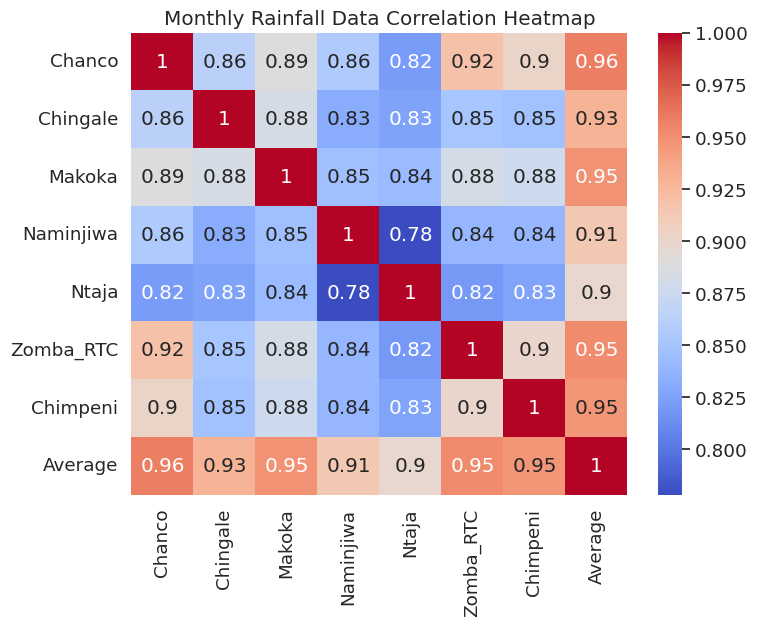

             Chanco  Chingale    Makoka  Naminjiwa     Ntaja  Zomba_RTC  \
Chanco     1.000000  0.862823  0.889892   0.855942  0.820837   0.919344   
Chingale   0.862823  1.000000  0.882234   0.831510  0.825252   0.850881   
Makoka     0.889892  0.882234  1.000000   0.845412  0.842180   0.880784   
Naminjiwa  0.855942  0.831510  0.845412   1.000000  0.778304   0.839018   
Ntaja      0.820837  0.825252  0.842180   0.778304  1.000000   0.819190   
Zomba_RTC  0.919344  0.850881  0.880784   0.839018  0.819190   1.000000   
Chimpeni   0.901609  0.847407  0.876281   0.839377  0.826468   0.899990   
Average    0.958045  0.929192  0.948355   0.913779  0.898252   0.952228   

           Chimpeni   Average  
Chanco     0.901609  0.958045  
Chingale   0.847407  0.929192  
Makoka     0.876281  0.948355  
Naminjiwa  0.839377  0.913779  
Ntaja      0.826468  0.898252  
Zomba_RTC  0.899990  0.952228  
Chimpeni   1.000000  0.946661  
Average    0.946661  1.000000  


In [13]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os

# Folder path containing the results
results_folder_path = '/content/MonthlyFromDailyRainfall/'

# Create the folder if it does not exist
if not os.path.exists(results_folder_path):
    os.makedirs(results_folder_path)

# Calculate the correlation matrix excluding the 'Date' column
correlation_matrix_monthly_rainfall = monthlyRainfall_data.drop(columns=['Date']).corr()

# Save the correlation matrix as an Excel file
excel_file_path = os.path.join(results_folder_path, 'MonthlyFromDailyRainfall_correlation_matrix_monthly_rainfall.xlsx')
correlation_matrix_monthly_rainfall.to_excel(excel_file_path)

# Create a correlation heatmap plot
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix_monthly_rainfall, annot=True, cmap='coolwarm')
plt.title('Monthly Rainfall Data Correlation Heatmap')

# Save the plot as a high-quality JPG file
plot_file_path = os.path.join(results_folder_path, 'MonthlyFromDailyRainfall_monthly_rainfall_data_correlation_plot.jpg')
plt.savefig(plot_file_path, dpi=300, bbox_inches='tight')
plt.show()

# Display the correlation matrix
print(correlation_matrix_monthly_rainfall)

### 1.2.3. Monthly Rainfall (Makoka Station vs Average)

Decision Tree - Mean Absolute Error (MAE): 23.07
Decision Tree - Mean Squared Error (MSE): 1436.96
Decision Tree - Root Mean Squared Error (RMSE): 37.91


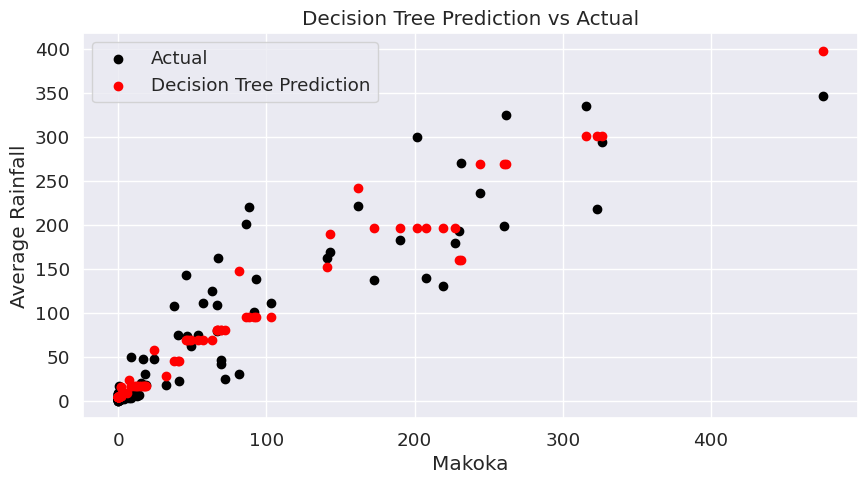

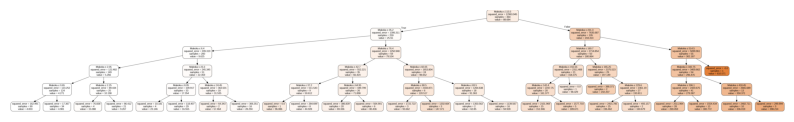

Linear Relationship Formula: Average = 0.93 * Makoka + 9.98
Linear Relationship - Mean Absolute Error (MAE): 25.22
Linear Relationship - Mean Squared Error (MSE): 1463.10
Linear Relationship - Root Mean Squared Error (RMSE): 38.25


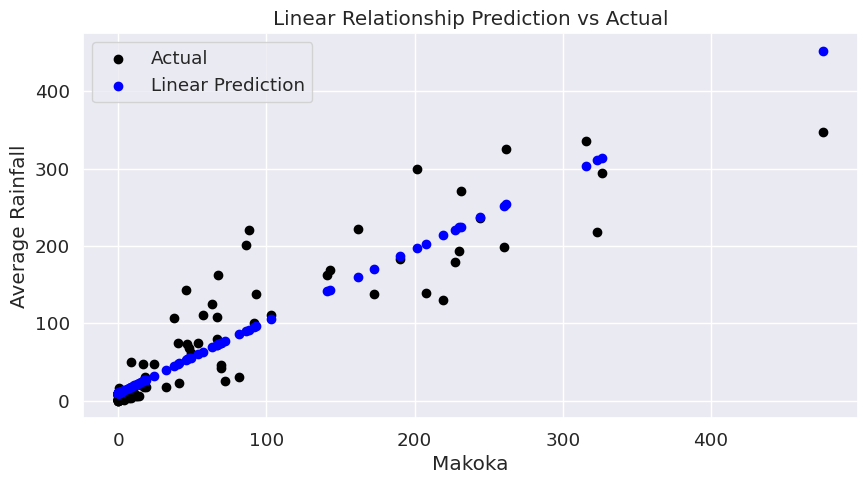

Non-linear Relationship Formula: Average = 0.00 * Makoka^0 + 1.13 * Makoka^1 + -0.00 * Makoka^2 
Non-linear Relationship - Mean Absolute Error (MAE): 22.89
Non-linear Relationship - Mean Squared Error (MSE): 1303.37
Non-linear Relationship - Root Mean Squared Error (RMSE): 36.10


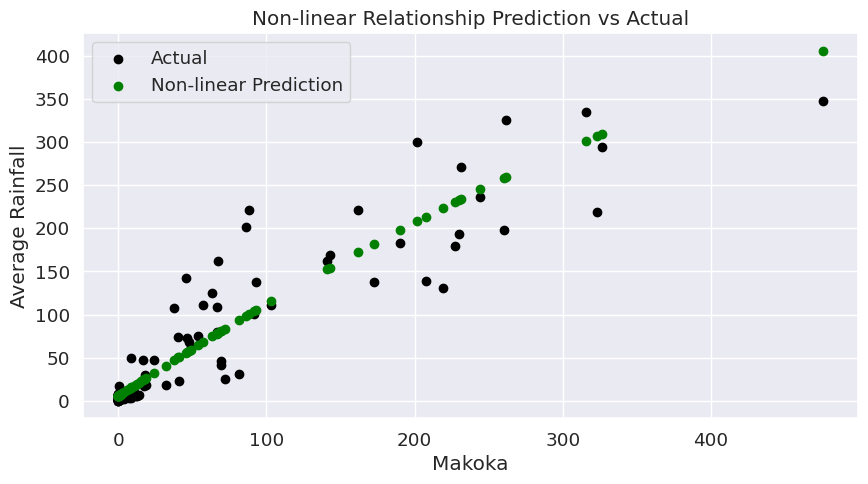

All outputs saved successfully.


In [14]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor, export_text, export_graphviz
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn import metrics
import matplotlib.pyplot as plt
import seaborn as sns
import graphviz
import os

# Folder path containing the results
results_folder_path = '/content/MonthlyFromDailyRainfall/'

# Create the folder if it does not exist
if not os.path.exists(results_folder_path):
    os.makedirs(results_folder_path)

# Load the data (replace 'monthly_data_filtered.xlsx' with your actual file name)
# Assuming monthlyRainfall_data is already available in Google Colab
# Replace 'monthly_data_filtered.xlsx' with your actual file name
monthlyRainfall_data

# Features (X) and target variable (y)
features = ['Makoka']
target = 'Average'

# Select relevant columns
dataTree = monthlyRainfall_data[features + [target]]

# Prepare data
X = dataTree[features]
y = dataTree[target]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Build Decision Tree model with trial and error for better accuracy
# You can experiment with different hyperparameters
dt_model = DecisionTreeRegressor(max_depth=5, min_samples_split=5, random_state=42)
dt_model.fit(X_train, y_train)

# Predictions
y_pred_tree = dt_model.predict(X_test)

# Evaluate the Decision Tree model
mae_tree = metrics.mean_absolute_error(y_test, y_pred_tree)
mse_tree = metrics.mean_squared_error(y_test, y_pred_tree)
rmse_tree = metrics.mean_squared_error(y_test, y_pred_tree, squared=False)

# Display evaluation metrics for Decision Tree
print(f'Decision Tree - Mean Absolute Error (MAE): {mae_tree:.2f}')
print(f'Decision Tree - Mean Squared Error (MSE): {mse_tree:.2f}')
print(f'Decision Tree - Root Mean Squared Error (RMSE): {rmse_tree:.2f}')

# Plot Decision Tree Prediction vs Actual
plt.figure(figsize=(10, 5))
plt.scatter(X_test, y_test, color='black', label='Actual')
plt.scatter(X_test, y_pred_tree, color='red', label='Decision Tree Prediction')
plt.title('Decision Tree Prediction vs Actual')
plt.xlabel('Makoka')
plt.ylabel('Average Rainfall')
plt.legend()

# Save the plot as a high-quality JPG file
plot_file_path = os.path.join(results_folder_path, 'MonthlyFromDailyRainfall_decision_tree_prediction_plot.jpg')
plt.savefig(plot_file_path, dpi=300, bbox_inches='tight')
plt.show()

# Export the Decision Tree to a Graphviz file
dot_data = export_graphviz(dt_model, out_file=None, feature_names=features, filled=True, rounded=True, special_characters=True)
graph = graphviz.Source(dot_data)
graph_file_path = os.path.join(results_folder_path, 'MonthlyFromDailyRainfall_decision_tree_graph')
graph.render(graph_file_path, format='png', cleanup=True)

# Display the Decision Tree
plt.figure(figsize=(10, 5))
img = plt.imread(graph_file_path + '.png')
plt.imshow(img)
plt.axis('off')

# Save the plot as a high-quality JPG file
plot_file_path = os.path.join(results_folder_path, 'MonthlyFromDailyRainfall_decision_tree_graph_plot.jpg')
plt.savefig(plot_file_path, dpi=300, bbox_inches='tight')
plt.show()

# Linear Relationship
X_linear = dataTree[['Makoka']]
y_linear = dataTree['Average']
linear_model = LinearRegression()
linear_model.fit(X_linear, y_linear)
slope_linear = linear_model.coef_[0]
intercept_linear = linear_model.intercept_
linear_formula = f'Average = {slope_linear:.2f} * Makoka + {intercept_linear:.2f}'
print(f"Linear Relationship Formula: {linear_formula}")

# Predictions for Linear Relationship
y_pred_linear = linear_model.predict(X_test)

# Evaluate the Linear model
mae_linear = metrics.mean_absolute_error(y_test, y_pred_linear)
mse_linear = metrics.mean_squared_error(y_test, y_pred_linear)
rmse_linear = metrics.mean_squared_error(y_test, y_pred_linear, squared=False)

# Display evaluation metrics for Linear Relationship
print(f'Linear Relationship - Mean Absolute Error (MAE): {mae_linear:.2f}')
print(f'Linear Relationship - Mean Squared Error (MSE): {mse_linear:.2f}')
print(f'Linear Relationship - Root Mean Squared Error (RMSE): {rmse_linear:.2f}')

# Plot Linear Relationship Prediction vs Actual
plt.figure(figsize=(10, 5))
plt.scatter(X_test, y_test, color='black', label='Actual')
plt.scatter(X_test, y_pred_linear, color='blue', label='Linear Prediction')
plt.title('Linear Relationship Prediction vs Actual')
plt.xlabel('Makoka')
plt.ylabel('Average Rainfall')
plt.legend()

# Save the plot as a high-quality JPG file
plot_file_path = os.path.join(results_folder_path, 'MonthlyFromDailyRainfall_linear_relationship_prediction_plot.jpg')
plt.savefig(plot_file_path, dpi=300, bbox_inches='tight')
plt.show()

# Non-linear Relationship (Polynomial Regression)
degree = 2  # You can adjust the degree of the polynomial
nonlinear_model = make_pipeline(PolynomialFeatures(degree), LinearRegression())
nonlinear_model.fit(X, y)
coefficients_nonlinear = nonlinear_model.named_steps['linearregression'].coef_
intercept_nonlinear = nonlinear_model.named_steps['linearregression'].intercept_
nonlinear_formula = 'Average = '
for i in range(degree + 1):
    nonlinear_formula += f'{coefficients_nonlinear[i]:.2f} * Makoka^{i} + '
nonlinear_formula = nonlinear_formula[:-2]  # Remove the trailing '+'
print(f"Non-linear Relationship Formula: {nonlinear_formula}")

# Predictions for Non-linear Relationship
y_pred_nonlinear = nonlinear_model.predict(X_test)

# Evaluate the Non-linear model
mae_nonlinear = metrics.mean_absolute_error(y_test, y_pred_nonlinear)
mse_nonlinear = metrics.mean_squared_error(y_test, y_pred_nonlinear)
rmse_nonlinear = metrics.mean_squared_error(y_test, y_pred_nonlinear, squared=False)

# Display evaluation metrics for Non-linear Relationship
print(f'Non-linear Relationship - Mean Absolute Error (MAE): {mae_nonlinear:.2f}')
print(f'Non-linear Relationship - Mean Squared Error (MSE): {mse_nonlinear:.2f}')
print(f'Non-linear Relationship - Root Mean Squared Error (RMSE): {rmse_nonlinear:.2f}')

# Plot Non-linear Relationship Prediction vs Actual
plt.figure(figsize=(10, 5))
plt.scatter(X_test, y_test, color='black', label='Actual')
plt.scatter(X_test, y_pred_nonlinear, color='green', label='Non-linear Prediction')
plt.title('Non-linear Relationship Prediction vs Actual')
plt.xlabel('Makoka')
plt.ylabel('Average Rainfall')
plt.legend()

# Save the plot as a high-quality JPG file
plot_file_path = os.path.join(results_folder_path, 'MonthlyFromDailyRainfall_nonlinear_relationship_prediction_plot.jpg')
plt.savefig(plot_file_path, dpi=300, bbox_inches='tight')
plt.show()

# Save the model predictions with a meaningful name
predictions_df = pd.DataFrame({'Actual': y_test, 'DecisionTree_Predicted': y_pred_tree,
                                'Linear_Predicted': y_pred_linear, 'Nonlinear_Predicted': y_pred_nonlinear})
predictions_file_path = os.path.join(results_folder_path, 'MonthlyFromDailyRainfall_model_predictions_and_errors.xlsx')
predictions_df.to_excel(predictions_file_path, index=False)

# Save feature importances with a meaningful name
feature_importances = pd.DataFrame({'Feature': features, 'Importance': dt_model.feature_importances_})
feature_importances_file_path = os.path.join(results_folder_path, 'MonthlyFromDailyRainfall_feature_importances_filtered.xlsx')
feature_importances.to_excel(feature_importances_file_path, index=False)

# Generate rules from the Decision Tree and save with a meaningful name
tree_rules = export_text(dt_model, feature_names=features)
tree_rules_file_path = os.path.join(results_folder_path, 'MonthlyFromDailyRainfall_decision_tree_rules_filtered.txt')
with open(tree_rules_file_path, 'w') as f:
    f.write(tree_rules)

print("All outputs saved successfully.")

### 1.2.4. Calculate Monthly Rainfall Anomaly

In [15]:
import pandas as pd
import os

# Folder path containing the results
results_folder_path = '/content/MonthlyFromDailyRainfall/'

# Create the folder if it does not exist
if not os.path.exists(results_folder_path):
    os.makedirs(results_folder_path)

# Calculate the anomaly of average rainfall
monthlyRainfall_data['Anomaly'] = monthlyRainfall_data['Average'] - monthlyRainfall_data['Average'].mean()

# Calculate the standard deviation
std_deviation = monthlyRainfall_data['Average'].std()

# Calculate the standardized anomaly
monthlyRainfall_data['Standardized Anomaly'] = monthlyRainfall_data['Anomaly'] / std_deviation

# Save the data to an Excel file with the specified prefix and folder path
output_file_path = os.path.join(results_folder_path, 'MonthlyFromDailyRainfall_standardized_anomaly.xlsx')
monthlyRainfall_data[['Date', 'Chanco', 'Chingale', 'Makoka', 'Naminjiwa', 'Ntaja', 'Zomba_RTC', 'Chimpeni', 'Average', 'Anomaly', 'Standardized Anomaly']].to_excel(output_file_path, index=False)

print(f'Data saved to {output_file_path}')

Data saved to /content/MonthlyFromDailyRainfall/MonthlyFromDailyRainfall_standardized_anomaly.xlsx


### 1.2.5. Monthly Rainfall Average Statistics Rainfall

In [16]:
import pandas as pd
import os

# Folder path containing the results
results_folder_path = '/content/MonthlyFromDailyRainfall/'

# Create the folder if it does not exist
if not os.path.exists(results_folder_path):
    os.makedirs(results_folder_path)

# Extract relevant columns
selected_columns = ['Date', 'Average']
monthly_data = monthlyRainfall_data[selected_columns]

# Extract month from the 'Date' column
monthly_data['Month'] = pd.to_datetime(monthly_data['Date']).dt.month_name()

# Group by month and calculate statistics
monthly_statistics = monthly_data.groupby('Month')['Average'].agg(['mean', 'max', 'min', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)])

# Rename the columns
monthly_statistics.columns = ['Mean', 'Max', 'Min', '25th Percentile', '75th Percentile']

# Save the monthly statistics to an Excel file with the specified prefix and folder path
output_file_path = os.path.join(results_folder_path, 'MonthlyFromDailyRainfall_monthly_average_statistics.xlsx')
monthly_statistics.to_excel(output_file_path)

# Display the monthly statistics
print(monthly_statistics)

                 Mean         Max         Min  25th Percentile  \
Month                                                            
April       48.222669  161.157143    9.585714        23.019643   
August       2.800922   13.757143    0.000000         0.439286   
December   206.017684  363.028571   98.328571       163.446429   
February   218.278143  421.600000   35.764286       136.935714   
January    280.631346  610.571429  110.950000       215.964286   
July         4.969865   29.800000    0.000000         1.317857   
June         3.677105   10.371429    0.000000         1.478571   
March      157.563589  364.935714   18.100000        98.500000   
May          8.098045   28.342857    0.200000         2.817857   
November    70.142195  222.500000   18.200000        53.167857   
October     19.727820   65.542857    1.328571         6.846429   
September    3.122932   21.514286    0.000000         0.542857   

           75th Percentile  
Month                       
April            

<ipython-input-16-b16b77743f70>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  monthly_data['Month'] = pd.to_datetime(monthly_data['Date']).dt.month_name()


### 1.2.6. Categorize Years of Wet/Dry/Normal Based on Monthly Rainfall Average Statistics

In [17]:
import pandas as pd
import numpy as np
import os

# Folder path containing the results
results_folder_path = '/content/MonthlyFromDailyRainfall/'

# Create the folder if it does not exist
if not os.path.exists(results_folder_path):
    os.makedirs(results_folder_path)

# Assuming monthlyRainfall_data is already available in Google Colab

# Extract relevant columns
selected_columns = ['Date', 'Average']
monthly_data = monthlyRainfall_data[selected_columns]

# Extract year from the 'Date' column
monthly_data['Year'] = pd.to_datetime(monthly_data['Date']).dt.year

# Categorize years as wet, dry, or normal based on average monthly rainfall
yearly_statistics = monthly_data.groupby('Year')['Average'].mean().reset_index()
yearly_statistics.columns = ['Year', 'Yearly Average']

conditions = [
    (yearly_statistics['Yearly Average'] > yearly_statistics['Yearly Average'].quantile(0.75)),
    (yearly_statistics['Yearly Average'] < yearly_statistics['Yearly Average'].quantile(0.25))
]

choices = ['Wet', 'Dry']
yearly_statistics['Category'] = np.select(conditions, choices, default='Normal')

# Merge categories back to the monthly data
monthly_data = pd.merge(monthly_data, yearly_statistics[['Year', 'Category']], on='Year', how='left')

# Extract month from the 'Date' column
monthly_data['Month'] = pd.to_datetime(monthly_data['Date']).dt.month_name()

# Group by category and month, calculate the mean
category_monthly_stats = monthly_data.groupby(['Category', 'Month'])['Average'].mean().reset_index()

# Order months chronologically
months_order = [
    'January', 'February', 'March', 'April', 'May', 'June',
    'July', 'August', 'September', 'October', 'November', 'December'
]

category_monthly_stats['Month'] = pd.Categorical(category_monthly_stats['Month'], categories=months_order, ordered=True)
category_monthly_stats = category_monthly_stats.sort_values(['Category', 'Month'])

# Save the results to an Excel file with the specified prefix and folder path
output_file_path = os.path.join(results_folder_path, 'MonthlyFromDailyRainfall_category_monthly_stats_ordered.xlsx')
category_monthly_stats.to_excel(output_file_path, index=False)

# Display the results
print("Years and Categories:")
print(monthly_data[['Year', 'Category']].drop_duplicates().sort_values(by=['Year']))

print("\nCategory Monthly Statistics:")
print(category_monthly_stats)

# Text description of the calculation method
description = """
The yearly average rainfall was calculated for each year.
Years were then categorized as 'Wet', 'Dry', or 'Normal' based on whether
the yearly average was in the top 25%, bottom 25%, or between these percentiles.
Monthly statistics were then calculated for each category, representing the
mean of the average monthly rainfall.
"""

print("\nCalculation Method:")
print(description)

Years and Categories:
     Year Category
0    1981      Dry
12   1982   Normal
24   1983      Dry
36   1984   Normal
48   1985      Wet
60   1986      Wet
72   1987   Normal
84   1988      Wet
96   1989      Wet
108  1990      Dry
120  1991      Wet
132  1992      Dry
144  1993   Normal
156  1994      Dry
168  1995      Dry
180  1996   Normal
192  1997      Wet
204  1998   Normal
216  1999   Normal
228  2000   Normal
240  2001   Normal
252  2002   Normal
264  2003   Normal
276  2004      Wet
288  2005      Dry
300  2006      Wet
312  2007      Wet
324  2008   Normal
336  2009   Normal
348  2010   Normal
360  2011   Normal
372  2012      Dry
384  2013   Normal
396  2014   Normal
408  2015      Wet
420  2016      Dry
432  2017   Normal
444  2018      Dry

Category Monthly Statistics:
   Category      Month     Average
4       Dry    January  207.732943
3       Dry   February  129.454029
7       Dry      March   99.644114
0       Dry      April   27.374714
8       Dry        May    8.4714

<ipython-input-17-93d4029d3a2c>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  monthly_data['Year'] = pd.to_datetime(monthly_data['Date']).dt.year


In [23]:
import pandas as pd
import numpy as np
import os

# Folder path containing the results
results_folder_path = '/content/MonthlyFromDailyRainfall/'

# Create the folder if it does not exist
if not os.path.exists(results_folder_path):
    os.makedirs(results_folder_path)

# Extract relevant columns
selected_columns = ['Date', 'Average']
monthly_data = monthlyRainfall_data[selected_columns].copy()  # Make a copy to avoid modifying the original DataFrame

# Extract year from the 'Date' column using .dt accessor and .loc to avoid SettingWithCopyWarning
monthly_data['Year'] = pd.to_datetime(monthly_data['Date']).dt.year

# Categorize years as wet, dry, or normal based on average monthly rainfall
# Calculate the yearly average rainfall
yearly_statistics = monthly_data.groupby('Year')['Average'].mean().reset_index()
yearly_statistics.columns = ['Year', 'Yearly Average']

# Define conditions for wet, dry, and normal years based on quantiles
conditions = [
    (yearly_statistics['Yearly Average'] > yearly_statistics['Yearly Average'].quantile(0.75)),
    (yearly_statistics['Yearly Average'] < yearly_statistics['Yearly Average'].quantile(0.25))
]

# Assign categories based on conditions
choices = ['Wet', 'Dry']
yearly_statistics['Category'] = np.select(conditions, choices, default='Normal')

# Merge categories back to the monthly data
monthly_data = pd.merge(monthly_data, yearly_statistics[['Year', 'Category']], on='Year', how='left')

# Extract month from the 'Date' column
monthly_data['Month'] = pd.to_datetime(monthly_data['Date']).dt.month_name()

# Group by category and month, calculate the mean
category_monthly_stats = monthly_data.groupby(['Category', 'Month'])['Average'].mean().reset_index()

# Order months chronologically
months_order = [
    'January', 'February', 'March', 'April', 'May', 'June',
    'July', 'August', 'September', 'October', 'November', 'December'
]

category_monthly_stats['Month'] = pd.Categorical(category_monthly_stats['Month'], categories=months_order, ordered=True)
category_monthly_stats = category_monthly_stats.sort_values(['Category', 'Month'])

# Identify the most dry and wet years
most_dry_year = yearly_statistics.loc[yearly_statistics['Category'] == 'Dry', 'Yearly Average'].idxmin()
most_wet_year = yearly_statistics.loc[yearly_statistics['Category'] == 'Wet', 'Yearly Average'].idxmax()

# Display the monthly data for the most dry and wet years
most_dry_data = monthly_data[monthly_data['Year'] == yearly_statistics.loc[most_dry_year, 'Year']]
most_wet_data = monthly_data[monthly_data['Year'] == yearly_statistics.loc[most_wet_year, 'Year']]

# Create an Excel file and save the data in separate sheets with the specified prefix and folder path
excel_file_path = os.path.join(results_folder_path, 'MonthlyFromDailyRainfall_rainfall_analysis_results.xlsx')
with pd.ExcelWriter(excel_file_path, engine='xlsxwriter') as writer:
    yearly_statistics.to_excel(writer, sheet_name='Yearly Statistics', index=False)
    category_monthly_stats.to_excel(writer, sheet_name='Monthly Statistics by Category', index=False)
    most_dry_data.to_excel(writer, sheet_name='Most Dry Year Data', index=False)
    most_wet_data.to_excel(writer, sheet_name='Most Wet Year Data', index=False)

# Provide an explanation of the calculation and save it with the specified prefix and folder path
explanation = (
    "Calculation Explanation:\n\n"
    "1. Yearly Statistics:\n"
    "   - Calculate the average monthly rainfall for each year.\n"
    "   - Categorize years as Wet, Dry, or Normal based on quantiles (25th and 75th percentiles).\n\n"
    "2. Monthly Statistics by Category:\n"
    "   - Group data by Category (Wet, Dry, Normal) and Month.\n"
    "   - Calculate the average monthly rainfall for each category and month.\n\n"
    "3. Most Dry and Wet Year Data:\n"
    "   - Identify the most dry and wet years based on category.\n"
    "   - Extract the monthly data for the most dry and wet years.\n"
    "   - Create an Excel file with separate sheets for each type of data."
)

explanation_file_path = os.path.join(results_folder_path, 'MonthlyFromDailyRainfall_calculation_explanation.txt')
with open(explanation_file_path, 'w') as f:
    f.write(explanation)

print("All outputs saved successfully.")

All outputs saved successfully.


## **1.3. Compare Average Monthly Raindfall Data and Satellite Rainfall Data**

### 1.3.1. Getting the Data of Monthly Rainfall

In [18]:
import pandas as pd
import matplotlib.pyplot as plt

url = 'https://github.com/mtofighi/ChilwaBasin/blob/main/ChilwaBasin_ClimateDailyAnalysis_032024/Data/ChilwaBasin_MonthlyRainfall_19812018.xlsx?raw=true'

dataRainMonths = pd.read_excel(url)

# Convert the index to datetime format (assuming the index is in a date format)
dataRainMonths.index = pd.to_datetime(dataRainMonths.iloc[:, 0])

# Extract year and month from the index
dataRainMonths['Year'] = dataRainMonths.index.year
dataRainMonths['Month'] = dataRainMonths.index.month

# Set the columns 'Year' and 'Month' as the index
dataRainMonths.set_index(['Year', 'Month'], inplace=True)

# Check the type of dataset
print("Data types:", dataRainMonths.dtypes)

# Check the shape of the data
print("Data shape:", dataRainMonths.shape)

# Convert the column names to an array
headers = dataRainMonths.columns.to_numpy()

# Print the headers array
print("Headers:", headers)

Data types: Date                datetime64[ns]
MonthlyAverage             float64
MonthlySatellite           float64
dtype: object
Data shape: (456, 3)
Headers: ['Date' 'MonthlyAverage' 'MonthlySatellite']


### 1.3.2. Correlation of Monthly Rainfall (Average vs Satellite)

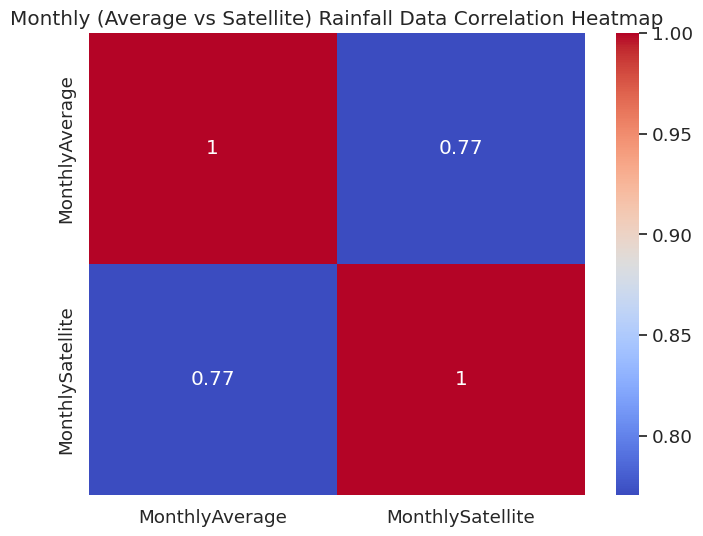

                  MonthlyAverage  MonthlySatellite
MonthlyAverage          1.000000          0.770634
MonthlySatellite        0.770634          1.000000


In [19]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os

# Folder path containing the results
results_folder_path = '/content/MonthlyRainfall/'

# Create the folder if it does not exist
if not os.path.exists(results_folder_path):
    os.makedirs(results_folder_path)

# Calculate the correlation matrix excluding the 'Date' column
correlation_matrix_monthly_AverageVsSatellite_rainfall = dataRainMonths.drop(columns=['Date']).corr()

# Save the correlation matrix as an Excel file with the specified prefix and folder path
correlation_matrix_file_path = os.path.join(results_folder_path, 'MonthlyRainfall_correlation_matrix_AverageVsSatellite_rainfall.xlsx')
correlation_matrix_monthly_AverageVsSatellite_rainfall.to_excel(correlation_matrix_file_path)

# Create a correlation heatmap plot
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix_monthly_AverageVsSatellite_rainfall, annot=True, cmap='coolwarm')
plt.title('Monthly (Average vs Satellite) Rainfall Data Correlation Heatmap')

# Save the plot with the specified prefix and folder path
plot_file_path = os.path.join(results_folder_path, 'MonthlyRainfall_correlation_plot_Average_vs_Satellite.jpg')
plt.savefig(plot_file_path, dpi=300, bbox_inches='tight')
plt.show()

# Display the correlation matrix
print(correlation_matrix_monthly_AverageVsSatellite_rainfall)

# **2. Temprature**
**Can we assume that the temperature of one station represents the temperature for the entire basin?**

We have data available for the Makoka station as well as the average satellite data for the entire basin obtained from the Google Earth Engine. *italicized text*



## **2.1. Daily Temprature Data**

### 2.1.1. Getting the Data of Daily Temprature

In [27]:
import os
import pandas as pd

# Replace the URL with the actual path to your Excel file
url = 'https://github.com/mtofighi/ChilwaBasin/blob/main/ChilwaBasin_ClimateDailyAnalysis_032024/Data/ChilwaBasin_Temperature_19812018.xlsx?raw=true'

# Read all sheets of the Excel file
dataTemp_dict = pd.read_excel(url, sheet_name=None)

# Dictionary to store dataframes
temp_dataframes = {}

# Iterate through each sheet (Min, Max, Mean)
for sheet_name, sheet_data in dataTemp_dict.items():
    # Convert the index to datetime format (assuming the index is in a date format)
    sheet_data.index = pd.to_datetime(sheet_data.iloc[:, 0])

    # Extract year and month from the index
    sheet_data['Year'] = sheet_data.index.year
    sheet_data['Month'] = sheet_data.index.month

    # Set the columns 'Year' and 'Month' as the index
    sheet_data.set_index(['Year', 'Month'], inplace=True)

    # Save each dataframe with a proper name
    temp_dataframes[f'{sheet_name}_data'] = sheet_data

    # Check the type of dataset for each sheet
    print(f"Data types for {sheet_name}:", sheet_data.dtypes)

    # Check the shape of the data for each sheet
    print(f"Data shape for {sheet_name}:", sheet_data.shape)

    # Convert the column names to an array for each sheet
    headers = sheet_data.columns.to_numpy()

    # Print the headers array for each sheet
    print(f"Headers for {sheet_name}:", headers)
    print("\n")

# Define the folder path where the Excel file will be saved
results_folder_path = '/content/DailyTemperature/'

# Ensure the folder exists, if not, create it
os.makedirs(results_folder_path, exist_ok=True)

# Define the file path for the Excel file
file_path = os.path.join(results_folder_path, 'DailyTemperature_temperature_data.xlsx')

# Save each dataframe to the Excel file
with pd.ExcelWriter(file_path) as writer:
    for name, df in temp_dataframes.items():
        df.to_excel(writer, sheet_name=name)

print(f"Dataframes saved successfully in '{file_path}'.")

Data types for Max: Date         datetime64[ns]
Chanco              float64
Chingale            float64
Makoka              float64
Naminjiwa           float64
Ntaja               float64
Zomba_RTC           float64
Average             float64
dtype: object
Data shape for Max: (13879, 8)
Headers for Max: ['Date' 'Chanco' 'Chingale' 'Makoka' 'Naminjiwa' 'Ntaja' 'Zomba_RTC'
 'Average']


Data types for Min: Date         datetime64[ns]
Chanco              float64
Chingale            float64
Makoka              float64
Naminjiwa           float64
Ntaja               float64
Zomba_RTC           float64
Average             float64
dtype: object
Data shape for Min: (13879, 8)
Headers for Min: ['Date' 'Chanco' 'Chingale' 'Makoka' 'Naminjiwa' 'Ntaja' 'Zomba_RTC'
 'Average']


Data types for Mean: Date         datetime64[ns]
Chanco              float64
Chingale            float64
Makoka              float64
Naminjiwa           float64
Ntaja               float64
Zomba_RTC           float64
Avera

### 2.1.2. Analyzing Missing Values of Daily Temprature


Missing Values for Max:
           Missing Values  Missing Percentage
Date                    0                 0.0
Chanco                  0                 0.0
Chingale                0                 0.0
Makoka                  0                 0.0
Naminjiwa               0                 0.0
Ntaja                   0                 0.0
Zomba_RTC               0                 0.0
Average                 0                 0.0
Missing values information saved in '/content/DailyTemperature/DailyTemperature_missing_values_Max.xlsx'.

Rows with all values present for Max:
                 Date  Chanco  Chingale  Makoka  Naminjiwa  Ntaja  Zomba_RTC  \
Year Month                                                                     
1981 1     1981-01-01    28.4      33.2    26.6       28.8   28.5       32.2   
     1     1981-01-02    27.5      32.2    25.4       29.7   28.5       31.1   
     1     1981-01-03    28.5      33.1    27.8       30.6   29.5       32.1   
     1     1981-

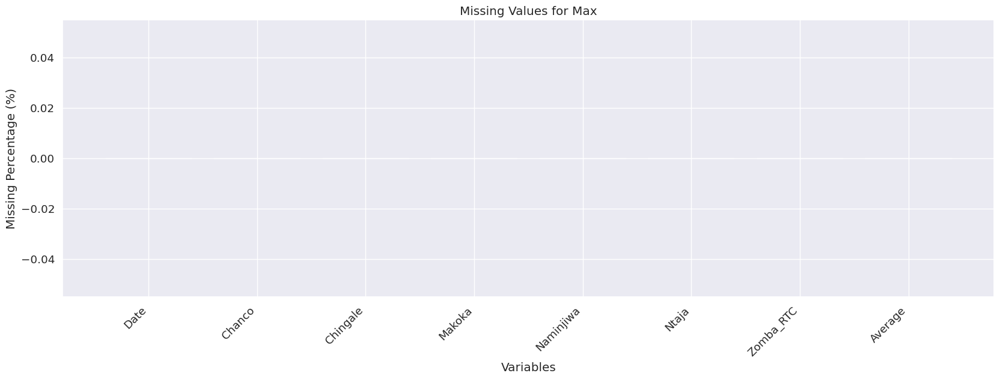


Missing Values for Min:
           Missing Values  Missing Percentage
Date                    0                 0.0
Chanco                  0                 0.0
Chingale                0                 0.0
Makoka                  0                 0.0
Naminjiwa               0                 0.0
Ntaja                   0                 0.0
Zomba_RTC               0                 0.0
Average                 0                 0.0
Missing values information saved in '/content/DailyTemperature/DailyTemperature_missing_values_Min.xlsx'.

Rows with all values present for Min:
                 Date  Chanco  Chingale  Makoka  Naminjiwa  Ntaja  Zomba_RTC  \
Year Month                                                                     
1981 1     1981-01-01    17.4      17.2    19.1       17.2   18.5       17.0   
     1     1981-01-02    17.0      18.3    17.2       16.4   19.0       17.8   
     1     1981-01-03    18.1      19.1    17.4       18.2   19.5       19.0   
     1     1981-

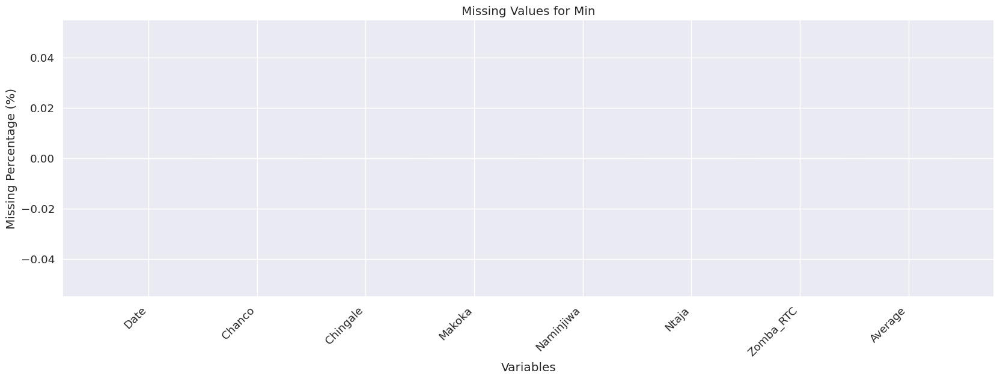


Missing Values for Mean:
           Missing Values  Missing Percentage
Date                    0                 0.0
Chanco                  0                 0.0
Chingale                0                 0.0
Makoka                  0                 0.0
Naminjiwa               0                 0.0
Ntaja                   0                 0.0
Zomba_RTC               0                 0.0
Average                 0                 0.0
Missing values information saved in '/content/DailyTemperature/DailyTemperature_missing_values_Mean.xlsx'.

Rows with all values present for Mean:
                 Date  Chanco  Chingale  Makoka  Naminjiwa  Ntaja  Zomba_RTC  \
Year Month                                                                     
1981 1     1981-01-01   22.90     25.20   22.85      23.00  23.50      24.60   
     1     1981-01-02   22.25     25.25   21.30      23.05  23.75      24.45   
     1     1981-01-03   23.30     26.10   22.60      24.40  24.50      25.55   
     1     19

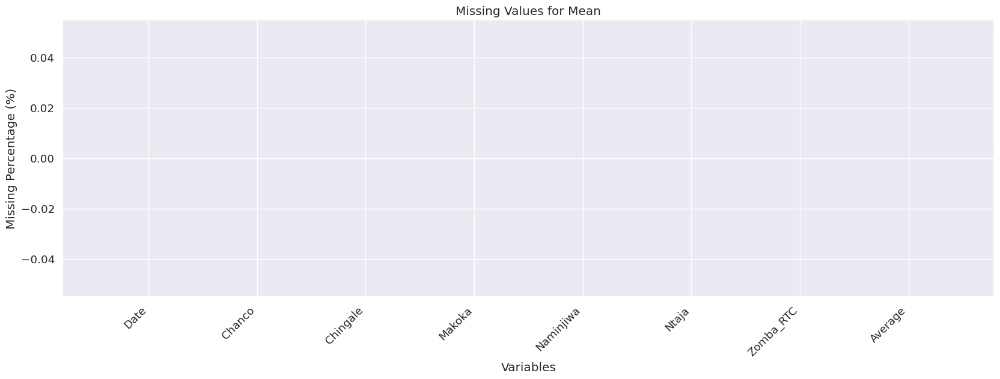

In [28]:
import os
import pandas as pd
import matplotlib.pyplot as plt

# Dictionary to store dataframes
temp_dataframes = {}

# Iterate through each sheet (Min, Max, Mean)
for sheet_name, sheet_data in dataTemp_dict.items():
    # Check for missing values
    missing_values = sheet_data.isnull().sum()
    missing_percentage = (missing_values / len(sheet_data)) * 100

    # Sort columns based on missing percentage
    missing_df = pd.DataFrame({'Missing Values': missing_values, 'Missing Percentage': missing_percentage})
    missing_df = missing_df.sort_values(by='Missing Percentage', ascending=False)

    # Print the missing values information for each sheet
    print(f"\nMissing Values for {sheet_name}:")
    print(missing_df)

    # Save the missing values information as an Excel file for each sheet
    results_folder_path = '/content/DailyTemperature/'
    os.makedirs(results_folder_path, exist_ok=True)
    missing_file_path = os.path.join(results_folder_path, f"DailyTemperature_missing_values_{sheet_name}.xlsx")
    missing_df.to_excel(missing_file_path)
    print(f"Missing values information saved in '{missing_file_path}'.")

    # Drop rows with any missing values (NaN)
    non_nan_rows = sheet_data.dropna()

    # Display the rows with all values present for each sheet
    print(f"\nRows with all values present for {sheet_name}:")
    print(non_nan_rows.head(5))

    # Save the rows with all values present as an Excel file for each sheet
    non_nan_rows_file_path = os.path.join(results_folder_path, f"DailyTemperature_non_nan_rows_{sheet_name}.xlsx")
    non_nan_rows.to_excel(non_nan_rows_file_path, index=False)
    print(f"Rows with all values present saved in '{non_nan_rows_file_path}'.")

    # Plotting the missing values for each sheet
    plt.figure(figsize=(20, 6))
    plt.bar(missing_df.index, missing_df['Missing Percentage'])
    plt.xlabel('Variables')
    plt.ylabel('Missing Percentage (%)')
    plt.title(f'Missing Values for {sheet_name}')
    plt.xticks(rotation=45, ha='right')
    plt.grid(True)

    # Save the plot as a high-quality JPG file for each sheet
    missing_values_plot_file_path = os.path.join(results_folder_path, f"DailyTemperature_missing_values_plot_{sheet_name}.jpg")
    plt.savefig(missing_values_plot_file_path, dpi=300, bbox_inches='tight')
    print(f"Missing values plot saved in '{missing_values_plot_file_path}'.")

    # Display the plot for each sheet
    plt.show()

    # Save each dataframe with a proper name for each sheet
    temp_dataframes[f'{sheet_name}_data'] = sheet_data

### 2.1.3. Chart and Pairplot of Daily Temprature


Data types for Max:
 Chanco       float64
Chingale     float64
Makoka       float64
Naminjiwa    float64
Ntaja        float64
Zomba_RTC    float64
Average      float64
dtype: object

Data shape for Max: (13879, 7)
Subdataset saved in '/content/DailyTemperature/DailyTemperature_sub_dataset_Max.xlsx'.
Temperature plot saved in '/content/DailyTemperature/DailyTemperature_temperature_plot_Max.jpg'.


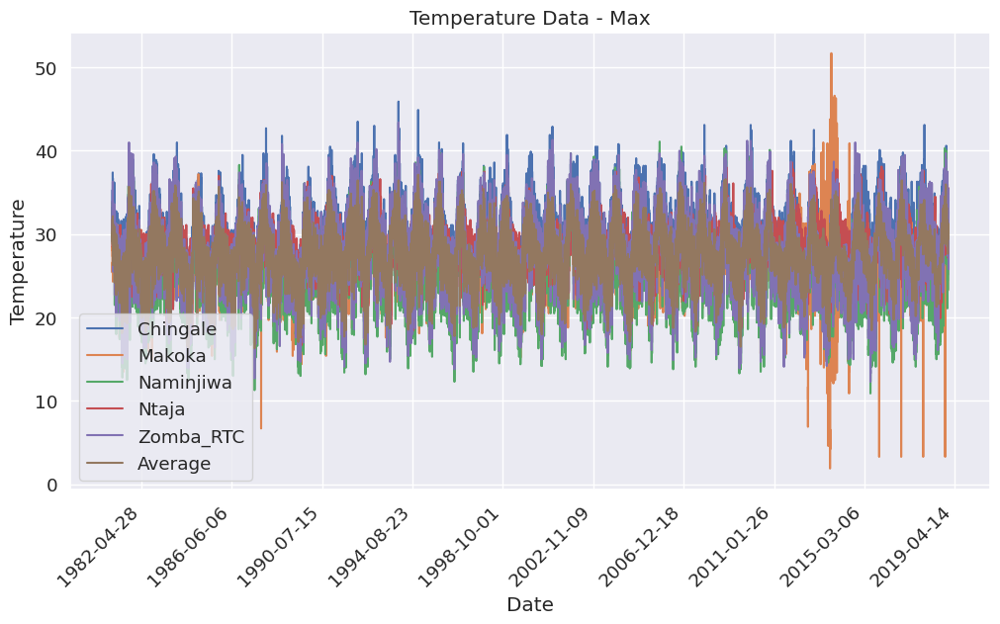

Pair plot with regression saved in '/content/DailyTemperature/DailyTemperature_sub_dataset_Max_pairplot_reg.jpg'.
Pair plot without regression saved in '/content/DailyTemperature/DailyTemperature_sub_dataset_Max_pairplot_scatter.jpg'.

Data types for Min:
 Chanco       float64
Chingale     float64
Makoka       float64
Naminjiwa    float64
Ntaja        float64
Zomba_RTC    float64
Average      float64
dtype: object

Data shape for Min: (13879, 7)
Subdataset saved in '/content/DailyTemperature/DailyTemperature_sub_dataset_Min.xlsx'.
Temperature plot saved in '/content/DailyTemperature/DailyTemperature_temperature_plot_Min.jpg'.


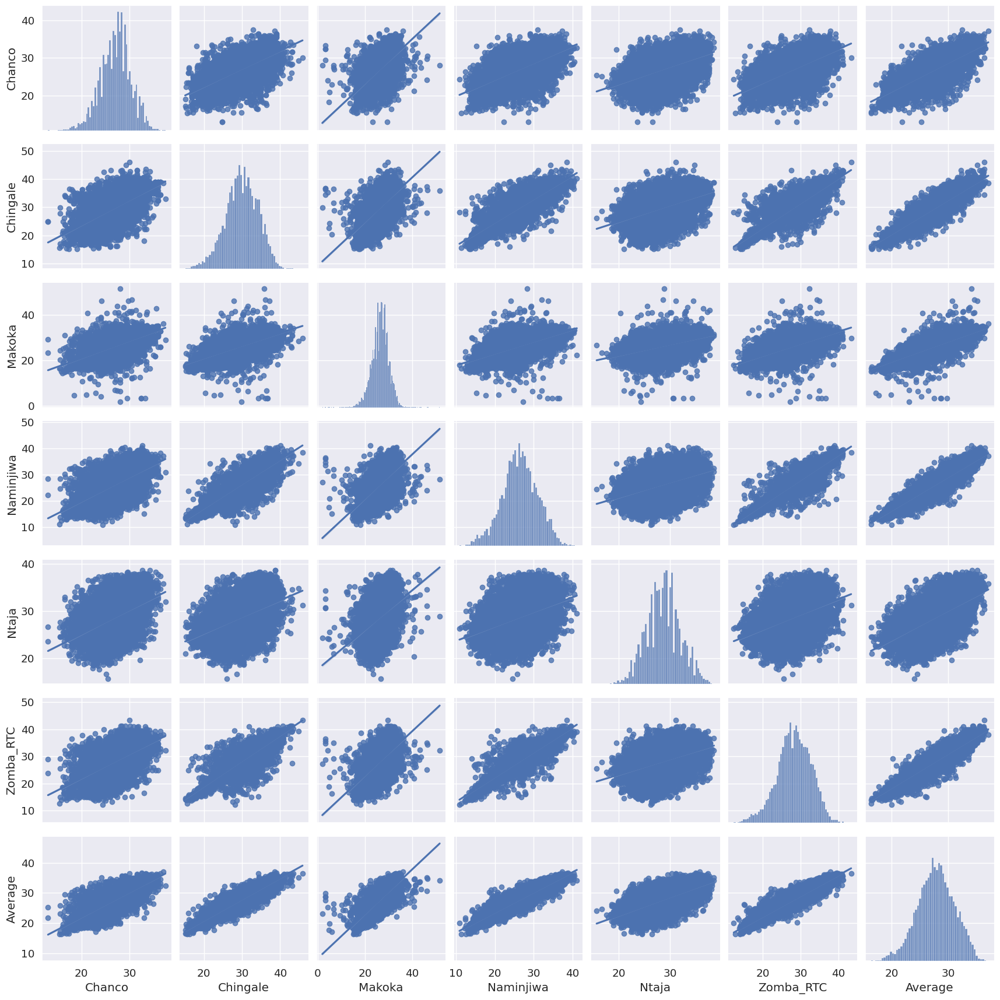

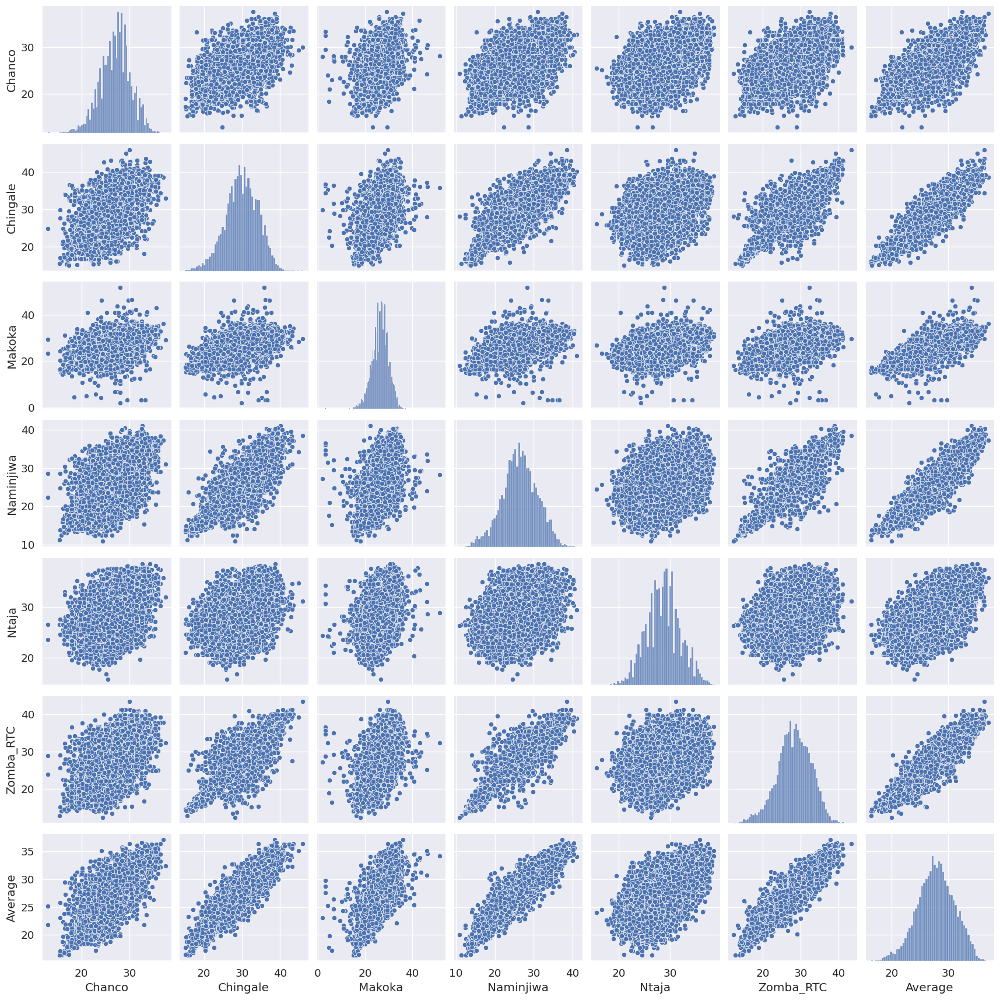

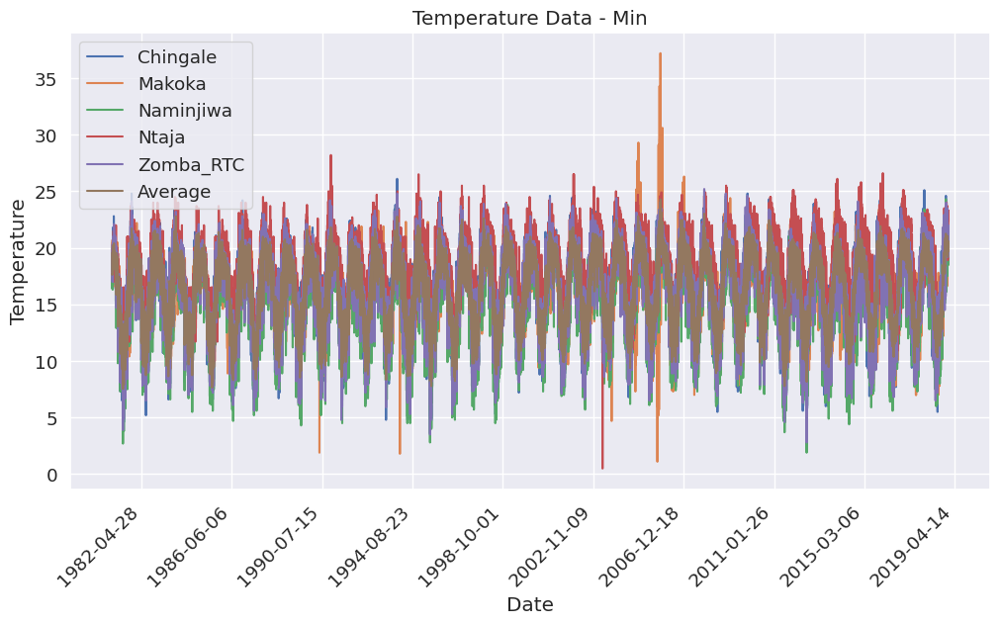

Pair plot with regression saved in '/content/DailyTemperature/DailyTemperature_sub_dataset_Min_pairplot_reg.jpg'.
Pair plot without regression saved in '/content/DailyTemperature/DailyTemperature_sub_dataset_Min_pairplot_scatter.jpg'.

Data types for Mean:
 Chanco       float64
Chingale     float64
Makoka       float64
Naminjiwa    float64
Ntaja        float64
Zomba_RTC    float64
Average      float64
dtype: object

Data shape for Mean: (13879, 7)
Subdataset saved in '/content/DailyTemperature/DailyTemperature_sub_dataset_Mean.xlsx'.
Temperature plot saved in '/content/DailyTemperature/DailyTemperature_temperature_plot_Mean.jpg'.


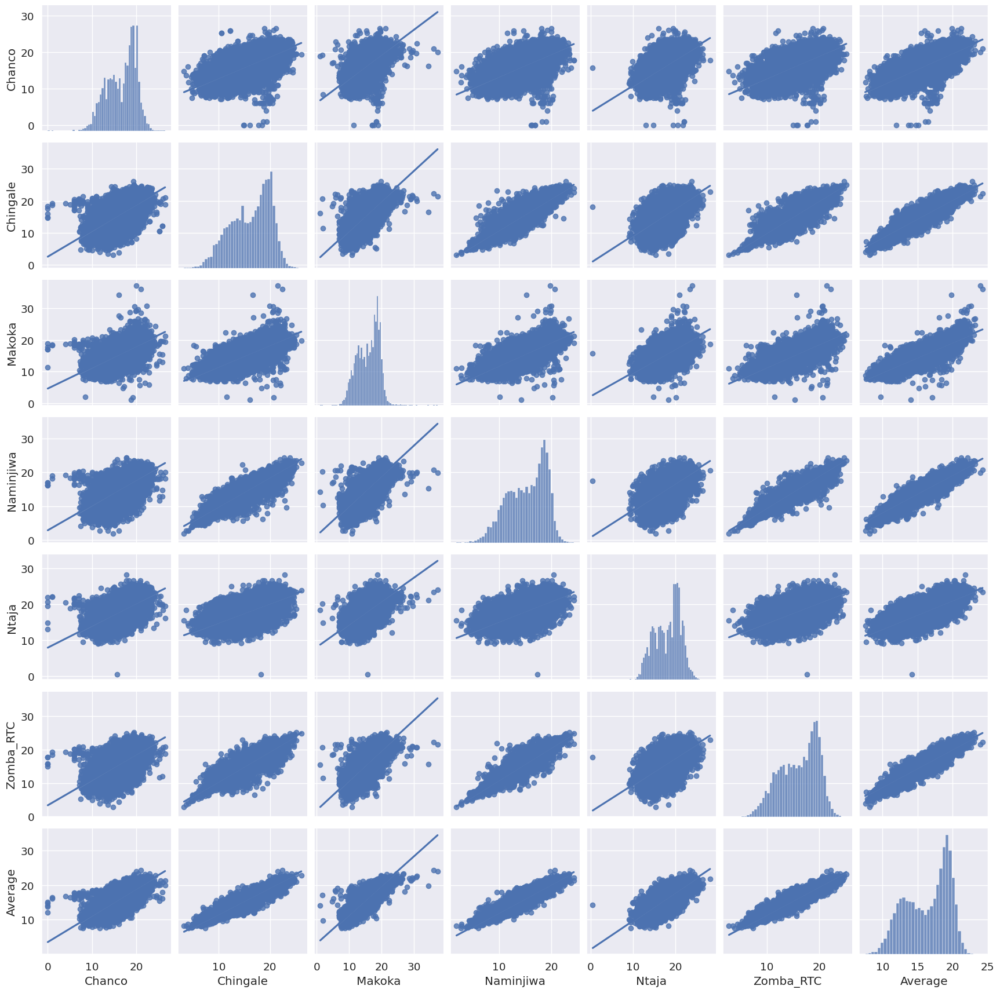

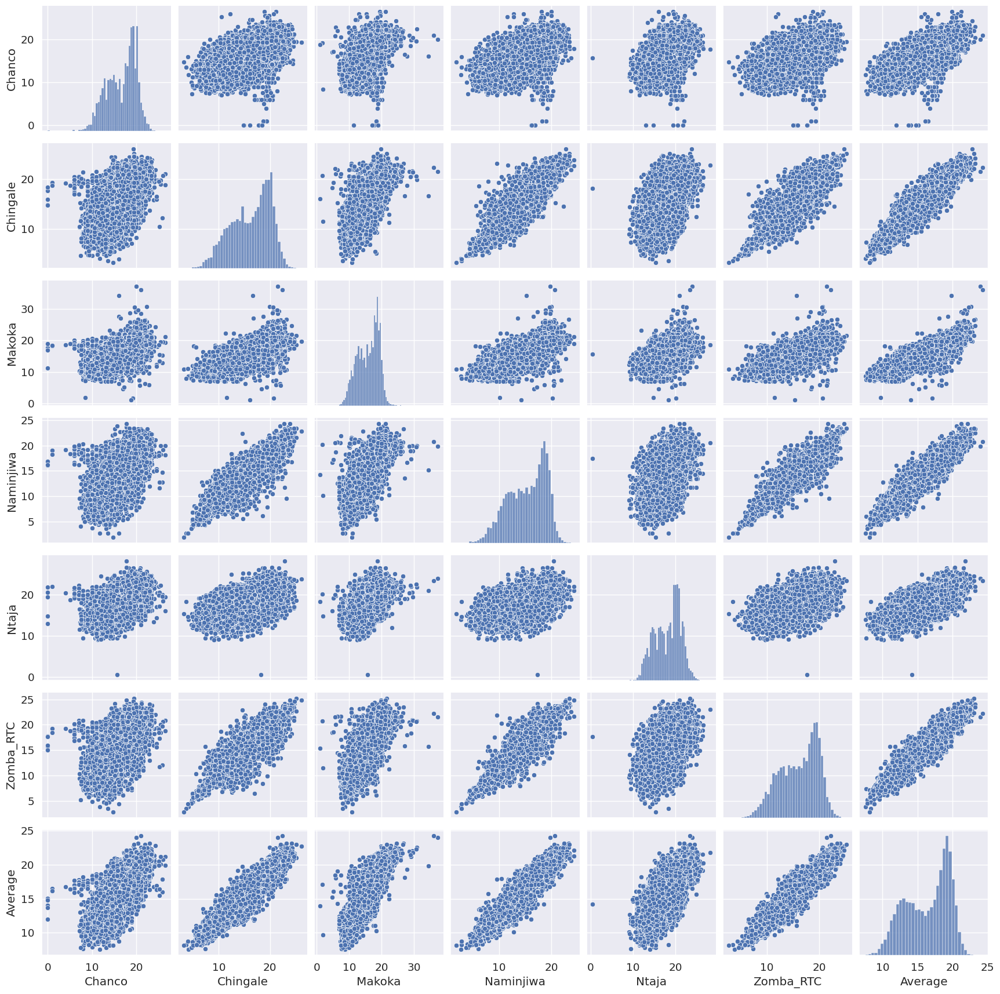

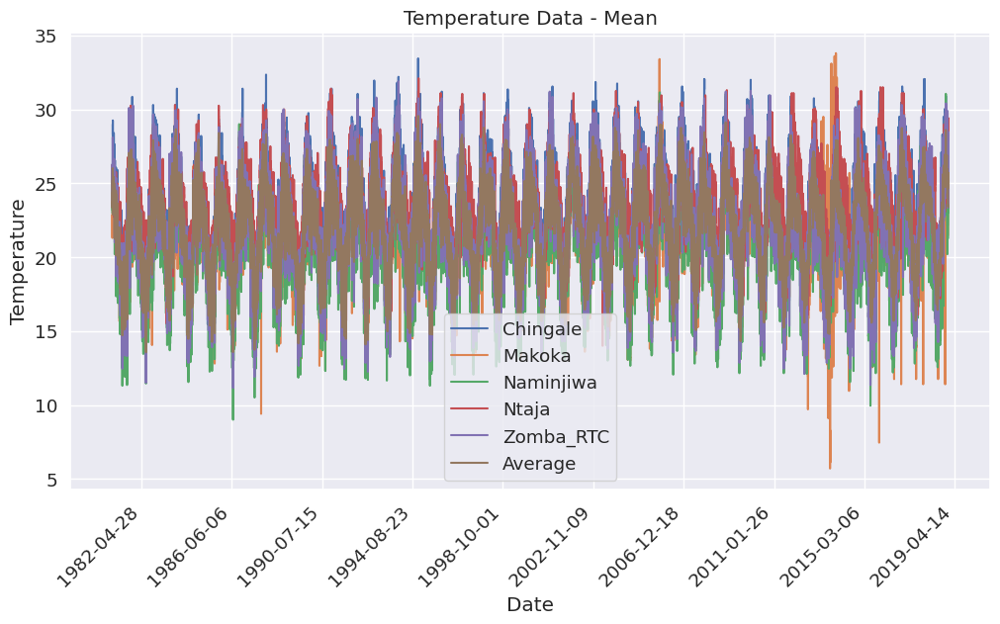

Pair plot with regression saved in '/content/DailyTemperature/DailyTemperature_sub_dataset_Mean_pairplot_reg.jpg'.
Pair plot without regression saved in '/content/DailyTemperature/DailyTemperature_sub_dataset_Mean_pairplot_scatter.jpg'.


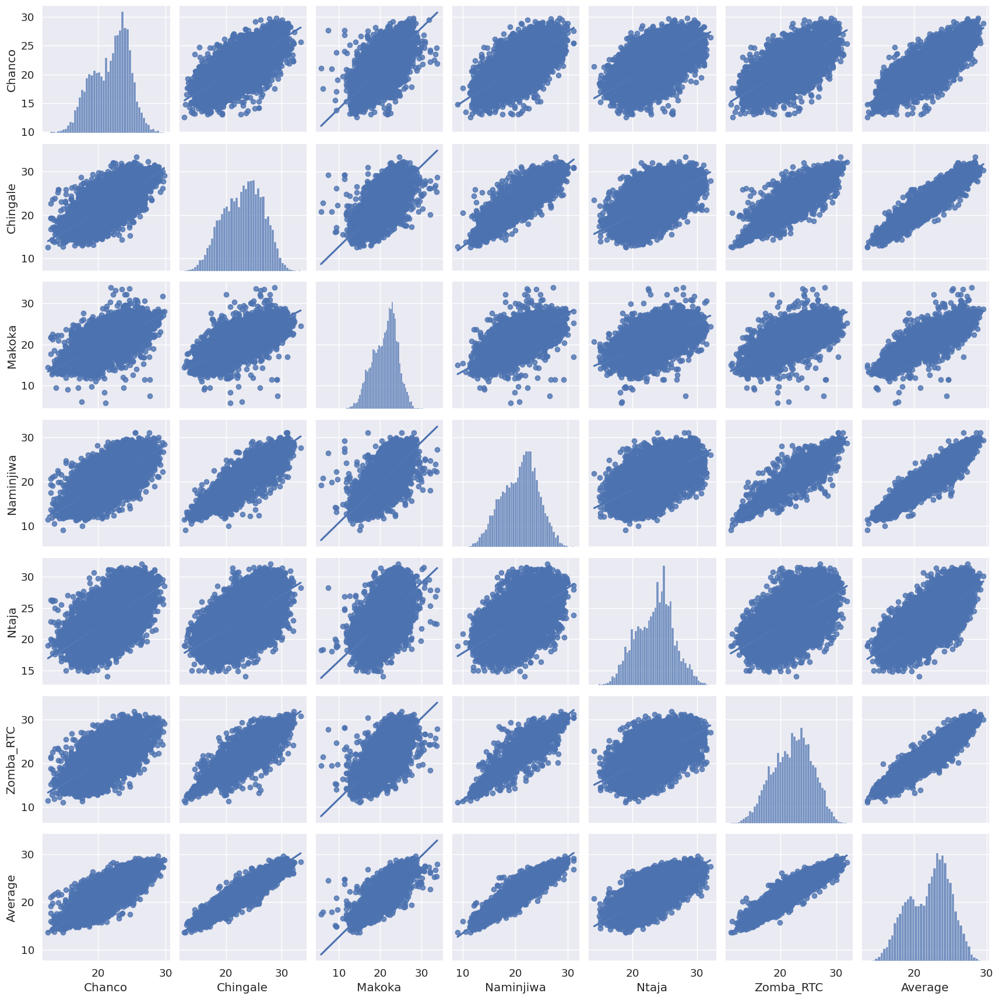

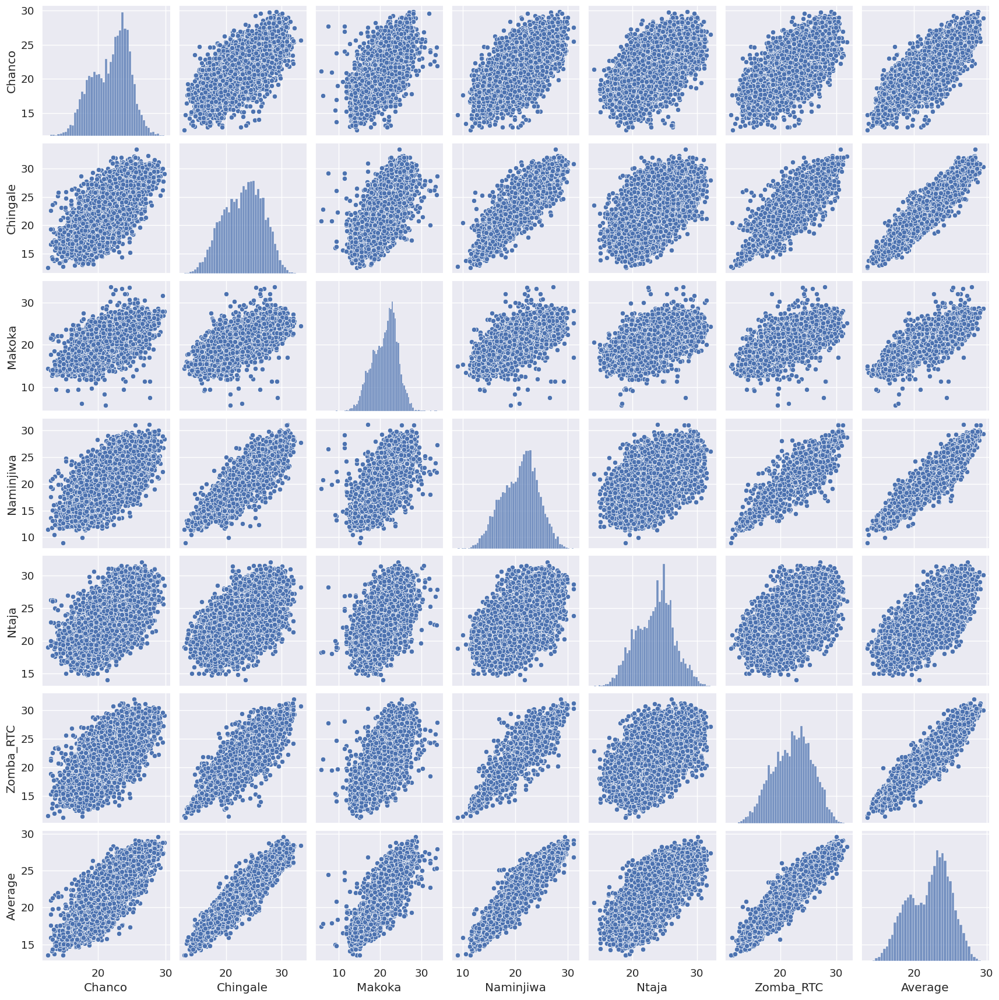

In [29]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'dataTemp_dict' is defined and contains the temperature datasets (Min, Max, Mean)
# Iterate through each sheet (Min, Max, Mean)
for sheet_name, sheet_data in dataTemp_dict.items():
    # Convert 'Date' column to datetime type
    sheet_data['Date'] = pd.to_datetime(sheet_data['Date'])

    # Set 'Date' column as the index
    sheet_data.set_index('Date', inplace=True)

    # Check the type of dataset for each sheet
    print(f"\nData types for {sheet_name}:\n", sheet_data.dtypes)

    # Check the shape of the data for each sheet
    print(f"\nData shape for {sheet_name}:", sheet_data.shape)

    # Save each subdataset as an Excel file for each sheet
    results_folder_path = '/content/DailyTemperature/'
    os.makedirs(results_folder_path, exist_ok=True)
    sub_dataset_file_path = os.path.join(results_folder_path, f"DailyTemperature_sub_dataset_{sheet_name}.xlsx")
    sheet_data.to_excel(sub_dataset_file_path, index=True)
    print(f"Subdataset saved in '{sub_dataset_file_path}'.")

    # Plotting the dataset for each sheet
    plt.figure(figsize=(12, 6))
    column_names = sheet_data.columns.tolist()
    for i, column in enumerate(column_names[1:]):
        sns.lineplot(data=sheet_data[column], label=column)  # Use the column as the data

    plt.xlabel('Date')
    plt.ylabel('Temperature')
    plt.title(f'Temperature Data - {sheet_name}')
    plt.legend()

    # Add grid lines
    plt.grid(True)

    # Set ticks on months
    plt.gca().xaxis.set_major_locator(plt.MaxNLocator(12))

    # Rotate x-axis labels for better readability
    plt.xticks(rotation=45, ha='right')

    # Save the plot as a high-quality JPG file for each sheet
    temperature_plot_file_path_jpg = os.path.join(results_folder_path, f"DailyTemperature_temperature_plot_{sheet_name}.jpg")
    plt.savefig(temperature_plot_file_path_jpg, dpi=300, bbox_inches='tight')
    print(f"Temperature plot saved in '{temperature_plot_file_path_jpg}'.")

    # Display the plot for each sheet
    plt.show()

    # Create a pair plot with regression for each sheet
    sns.set(font_scale=1.2)  # Increase the font size for better legibility
    pairplot_reg = sns.pairplot(sheet_data, kind="reg")
    pairplot_reg_file_path = os.path.join(results_folder_path, f"DailyTemperature_sub_dataset_{sheet_name}_pairplot_reg.jpg")
    pairplot_reg.savefig(pairplot_reg_file_path, dpi=300, bbox_inches='tight')
    print(f"Pair plot with regression saved in '{pairplot_reg_file_path}'.")

    # Create a pair plot without regression for each sheet
    sns.set(font_scale=1.2)  # Increase the font size for better legibility
    pairplot_scatter = sns.pairplot(sheet_data, kind="scatter")
    pairplot_scatter_file_path = os.path.join(results_folder_path, f"DailyTemperature_sub_dataset_{sheet_name}_pairplot_scatter.jpg")
    pairplot_scatter.savefig(pairplot_scatter_file_path, dpi=300, bbox_inches='tight')
    print(f"Pair plot without regression saved in '{pairplot_scatter_file_path}'.")

### 2.1.4. Visualizing the Correlation of Daily Temprature

Correlation matrix saved in '/content/DailyTemperature/DailyTemperature_Max_correlation_matrix.xlsx'.


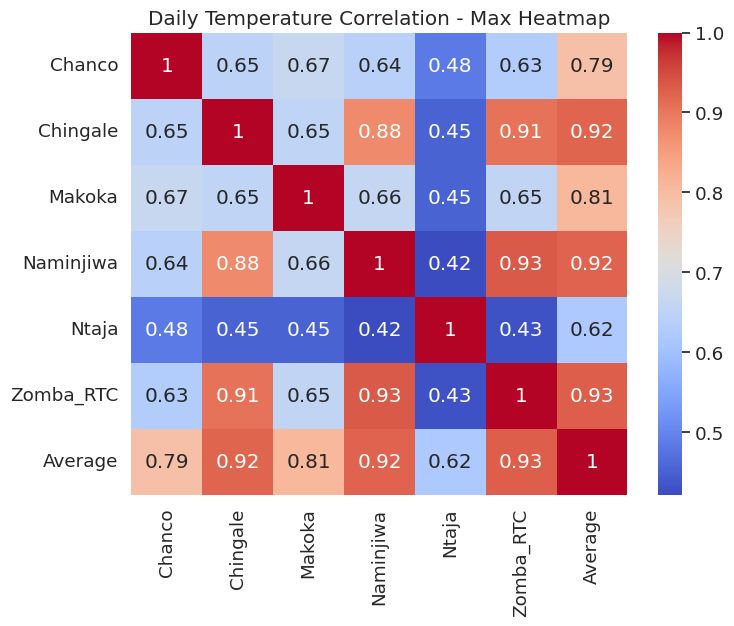


Correlation Matrix for Max:
             Chanco  Chingale    Makoka  Naminjiwa     Ntaja  Zomba_RTC  \
Chanco     1.000000  0.646855  0.666625   0.639218  0.484114   0.629395   
Chingale   0.646855  1.000000  0.653178   0.877263  0.452535   0.906782   
Makoka     0.666625  0.653178  1.000000   0.663106  0.451404   0.654917   
Naminjiwa  0.639218  0.877263  0.663106   1.000000  0.421619   0.932360   
Ntaja      0.484114  0.452535  0.451404   0.421619  1.000000   0.430260   
Zomba_RTC  0.629395  0.906782  0.654917   0.932360  0.430260   1.000000   
Average    0.791791  0.921966  0.806529   0.924594  0.619798   0.929143   

            Average  
Chanco     0.791791  
Chingale   0.921966  
Makoka     0.806529  
Naminjiwa  0.924594  
Ntaja      0.619798  
Zomba_RTC  0.929143  
Average    1.000000  
Correlation matrix saved in '/content/DailyTemperature/DailyTemperature_Min_correlation_matrix.xlsx'.


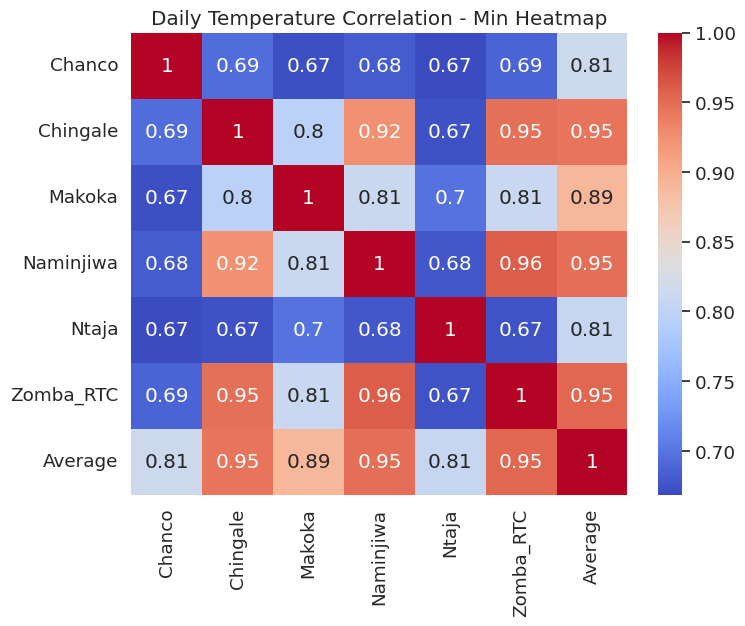


Correlation Matrix for Min:
             Chanco  Chingale    Makoka  Naminjiwa     Ntaja  Zomba_RTC  \
Chanco     1.000000  0.693362  0.672446   0.680982  0.668657   0.687014   
Chingale   0.693362  1.000000  0.795655   0.924394  0.673229   0.947669   
Makoka     0.672446  0.795655  1.000000   0.811772  0.697482   0.810352   
Naminjiwa  0.680982  0.924394  0.811772   1.000000  0.676740   0.961021   
Ntaja      0.668657  0.673229  0.697482   0.676740  1.000000   0.674222   
Zomba_RTC  0.687014  0.947669  0.810352   0.961021  0.674222   1.000000   
Average    0.814865  0.945372  0.890633   0.948230  0.807717   0.953544   

            Average  
Chanco     0.814865  
Chingale   0.945372  
Makoka     0.890633  
Naminjiwa  0.948230  
Ntaja      0.807717  
Zomba_RTC  0.953544  
Average    1.000000  
Correlation matrix saved in '/content/DailyTemperature/DailyTemperature_Mean_correlation_matrix.xlsx'.


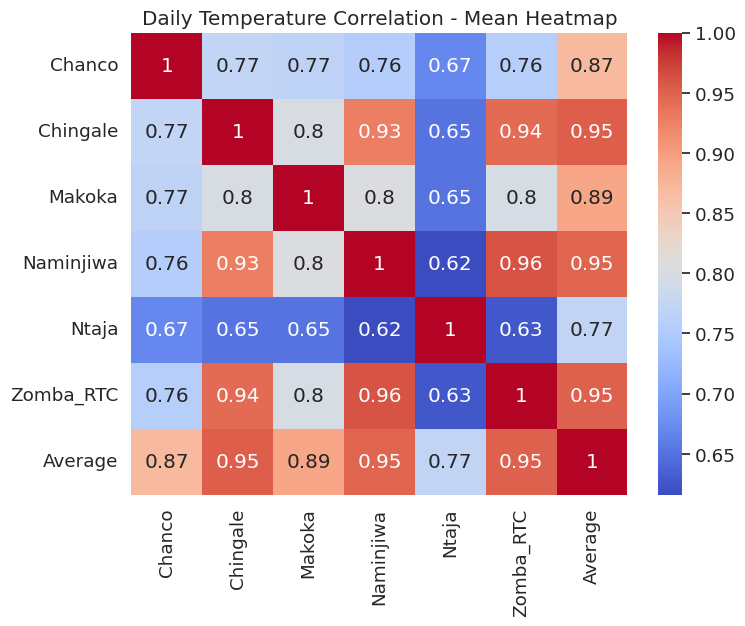


Correlation Matrix for Mean:
             Chanco  Chingale    Makoka  Naminjiwa     Ntaja  Zomba_RTC  \
Chanco     1.000000  0.772745  0.767064   0.756725  0.670025   0.757100   
Chingale   0.772745  1.000000  0.800191   0.927112  0.651790   0.943830   
Makoka     0.767064  0.800191  1.000000   0.804466  0.651412   0.798934   
Naminjiwa  0.756725  0.927112  0.804466   1.000000  0.616118   0.960425   
Ntaja      0.670025  0.651790  0.651412   0.616118  1.000000   0.625136   
Zomba_RTC  0.757100  0.943830  0.798934   0.960425  0.625136   1.000000   
Average    0.868342  0.952507  0.891997   0.947630  0.771374   0.951775   

            Average  
Chanco     0.868342  
Chingale   0.952507  
Makoka     0.891997  
Naminjiwa  0.947630  
Ntaja      0.771374  
Zomba_RTC  0.951775  
Average    1.000000  


In [31]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'dataTemp_dict' is defined and contains the temperature datasets (Min, Max, Mean)
# Iterate through each sheet (Min, Max, Mean)
for sheet_name, sheet_data in dataTemp_dict.items():
    # Calculate the correlation matrix for each sheet
    temp_correlation_matrix = sheet_data.corr()

    # Save the correlation matrix as an Excel file for each sheet
    results_folder_path = '/content/DailyTemperature/'
    os.makedirs(results_folder_path, exist_ok=True)
    correlation_matrix_file_path = os.path.join(results_folder_path, f'DailyTemperature_{sheet_name}_correlation_matrix.xlsx')
    temp_correlation_matrix.to_excel(correlation_matrix_file_path)
    print(f"Correlation matrix saved in '{correlation_matrix_file_path}'.")

    # Create a correlation heatmap plot for each sheet
    plt.figure(figsize=(8, 6))
    sns.heatmap(temp_correlation_matrix, annot=True, cmap='coolwarm')
    plt.title(f'Daily Temperature Correlation - {sheet_name} Heatmap')
    plt.savefig(f'/content/DailyTemperature/DailyTemperature_{sheet_name}_correlation_plot.jpg', dpi=300, bbox_inches='tight')
    plt.show()

    # Display the correlation matrix for each sheet
    print(f'\nCorrelation Matrix for {sheet_name}:\n{temp_correlation_matrix}')

## **2.2. Monthly Temprature Data from Daily Data**

### 2.2.1. Creating the Monthly Data of Daily Temprature

In [39]:
import os
import pandas as pd
import uuid

# Create an Excel writer object
output_folder_path = '/content/MonthlyFromDailyTemperature'
os.makedirs(output_folder_path, exist_ok=True)

with pd.ExcelWriter(os.path.join(output_folder_path, 'MonthlyFromDailyTemperature_analysis_results.xlsx'), engine='xlsxwriter') as writer:
    # Assuming 'dataTemp_dict' is defined and contains the temperature datasets (Min, Max, Mean)
    for sheet_name, sheet_data in dataTemp_dict.items():
        # Check if the 'Date' is part of the index
        if 'Date' in sheet_data.index.names:
            # Specify the columns you want to aggregate
            columns_to_aggregate = ['Chanco', 'Chingale', 'Makoka', 'Naminjiwa', 'Ntaja', 'Zomba_RTC', 'Average']

            # Check if the specified columns exist in the dataset
            missing_columns = set(columns_to_aggregate) - set(sheet_data.columns)
            if missing_columns:
                print(f"\nError: Columns {missing_columns} not found in the {sheet_name} dataset.")
                continue

            # Resample the data to monthly frequency, taking the first day of each month
            monthlyTemperature_data = sheet_data[columns_to_aggregate].resample('MS').mean()

            # Reset the index to have a default integer index
            monthlyTemperature_data.reset_index(inplace=True)

            # Format the 'Date' column as 2/1/2000
            monthlyTemperature_data['Date'] = monthlyTemperature_data['Date'].dt.strftime('%m/%d/%Y')

            # Generate a unique identifier for the sheet name
            unique_identifier = uuid.uuid4().hex[:10]  # Use the first 10 characters of the UUID

            # Combine the unique identifier with the sheet name
            sheet_name_combined = f'{unique_identifier}_{sheet_name.lower().replace(" ", "_")}'

            # Truncate the sheet name if it exceeds the 31-character limit
            if len(sheet_name_combined) > 31:
                sheet_name_combined = sheet_name_combined[:31]

            # Save the monthly dataset to the Excel file with the combined sheet name
            monthlyTemperature_data.to_excel(writer, sheet_name=sheet_name_combined, index=False)
        else:
            print(f"\nError: 'Date' not part of the index in the {sheet_name} dataset.")

### 2.2.2. Correlation of Monthly Temprature

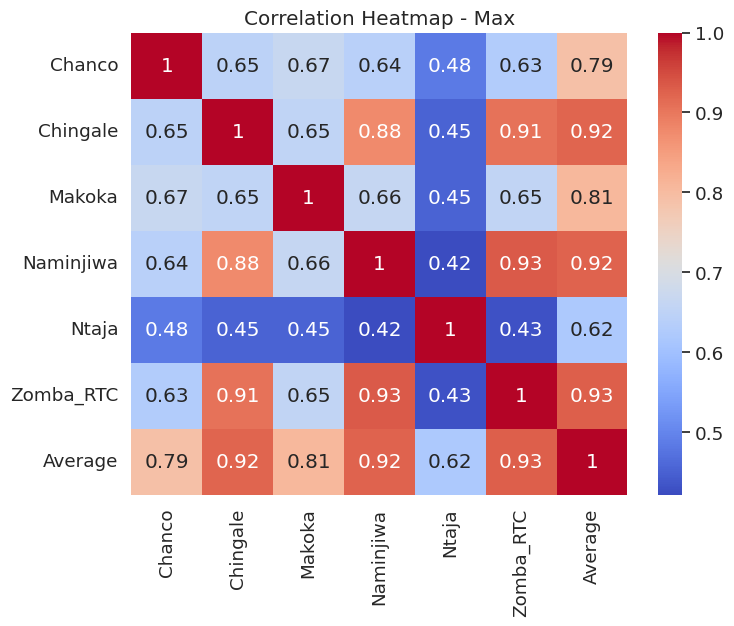


Correlation Matrix - Max:
             Chanco  Chingale    Makoka  Naminjiwa     Ntaja  Zomba_RTC  \
Chanco     1.000000  0.646855  0.666625   0.639218  0.484114   0.629395   
Chingale   0.646855  1.000000  0.653178   0.877263  0.452535   0.906782   
Makoka     0.666625  0.653178  1.000000   0.663106  0.451404   0.654917   
Naminjiwa  0.639218  0.877263  0.663106   1.000000  0.421619   0.932360   
Ntaja      0.484114  0.452535  0.451404   0.421619  1.000000   0.430260   
Zomba_RTC  0.629395  0.906782  0.654917   0.932360  0.430260   1.000000   
Average    0.791791  0.921966  0.806529   0.924594  0.619798   0.929143   

            Average  
Chanco     0.791791  
Chingale   0.921966  
Makoka     0.806529  
Naminjiwa  0.924594  
Ntaja      0.619798  
Zomba_RTC  0.929143  
Average    1.000000  


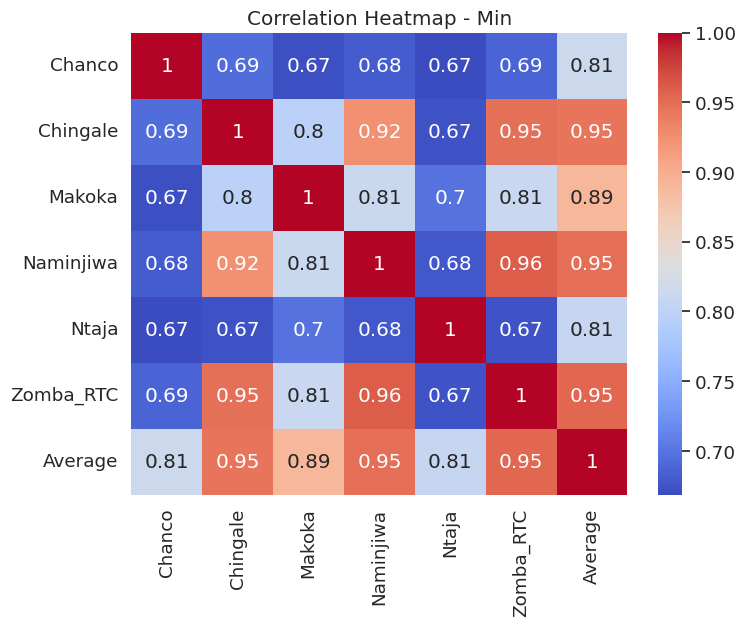


Correlation Matrix - Min:
             Chanco  Chingale    Makoka  Naminjiwa     Ntaja  Zomba_RTC  \
Chanco     1.000000  0.693362  0.672446   0.680982  0.668657   0.687014   
Chingale   0.693362  1.000000  0.795655   0.924394  0.673229   0.947669   
Makoka     0.672446  0.795655  1.000000   0.811772  0.697482   0.810352   
Naminjiwa  0.680982  0.924394  0.811772   1.000000  0.676740   0.961021   
Ntaja      0.668657  0.673229  0.697482   0.676740  1.000000   0.674222   
Zomba_RTC  0.687014  0.947669  0.810352   0.961021  0.674222   1.000000   
Average    0.814865  0.945372  0.890633   0.948230  0.807717   0.953544   

            Average  
Chanco     0.814865  
Chingale   0.945372  
Makoka     0.890633  
Naminjiwa  0.948230  
Ntaja      0.807717  
Zomba_RTC  0.953544  
Average    1.000000  


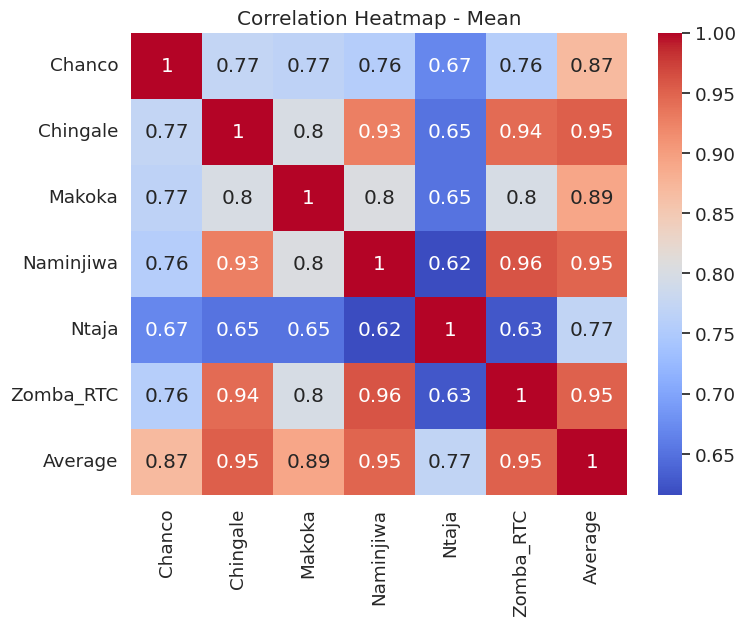


Correlation Matrix - Mean:
             Chanco  Chingale    Makoka  Naminjiwa     Ntaja  Zomba_RTC  \
Chanco     1.000000  0.772745  0.767064   0.756725  0.670025   0.757100   
Chingale   0.772745  1.000000  0.800191   0.927112  0.651790   0.943830   
Makoka     0.767064  0.800191  1.000000   0.804466  0.651412   0.798934   
Naminjiwa  0.756725  0.927112  0.804466   1.000000  0.616118   0.960425   
Ntaja      0.670025  0.651790  0.651412   0.616118  1.000000   0.625136   
Zomba_RTC  0.757100  0.943830  0.798934   0.960425  0.625136   1.000000   
Average    0.868342  0.952507  0.891997   0.947630  0.771374   0.951775   

            Average  
Chanco     0.868342  
Chingale   0.952507  
Makoka     0.891997  
Naminjiwa  0.947630  
Ntaja      0.771374  
Zomba_RTC  0.951775  
Average    1.000000  


In [41]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Create an Excel writer object
output_folder_path = '/content/MonthlyFromDailyTemperature'
os.makedirs(output_folder_path, exist_ok=True)

with pd.ExcelWriter(os.path.join(output_folder_path, 'MonthlyFromDailyTemperature_correlation_matrix_datasets.xlsx'), engine='xlsxwriter') as writer:
    # Assuming 'dataTemp_dict' is defined and contains the temperature datasets (Min, Max, Mean)
    for sheet_name, sheet_data in dataTemp_dict.items():
        # Check if the 'Date' is part of the index
        if 'Date' in sheet_data.index.names:
            # Specify the columns you want to include in the correlation matrix
            columns_for_correlation = ['Chanco', 'Chingale', 'Makoka', 'Naminjiwa', 'Ntaja', 'Zomba_RTC', 'Average']

            # Check if the specified columns exist in the dataset
            missing_columns = set(columns_for_correlation) - set(sheet_data.columns)
            if missing_columns:
                print(f"\nError: Columns {missing_columns} not found in the {sheet_name} dataset.")
                continue

            # Calculate the correlation matrix
            correlation_matrix = sheet_data[columns_for_correlation].corr()

            # Save the correlation matrix to the Excel file with a proper sheet name
            sheet_name_cleaned = sheet_name.lower().replace(' ', '_')
            correlation_matrix.to_excel(writer, sheet_name=f'correlation_matrix_{sheet_name_cleaned}', index=True)

            # Create a correlation heatmap plot
            plt.figure(figsize=(8, 6))
            sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
            plt.title(f'Correlation Heatmap - {sheet_name}')
            plt.savefig(os.path.join(output_folder_path, f'MonthlyFromDailyTemperature_correlation_heatmap_{sheet_name_cleaned}.jpg'), dpi=300, bbox_inches='tight')
            plt.show()

            # Display the correlation matrix for each sheet
            print(f"\nCorrelation Matrix - {sheet_name}:\n{correlation_matrix}")
        else:
            print(f"\nError: 'Date' not part of the index in the {sheet_name} dataset.")

### 2.2.3. Monthly Temprature (Makoka Station vs Average)

Decision Tree - Mean Absolute Error (MAE) for Max: 1.39
Decision Tree - Mean Squared Error (MSE) for Max: 3.33
Decision Tree - Root Mean Squared Error (RMSE) for Max: 1.82


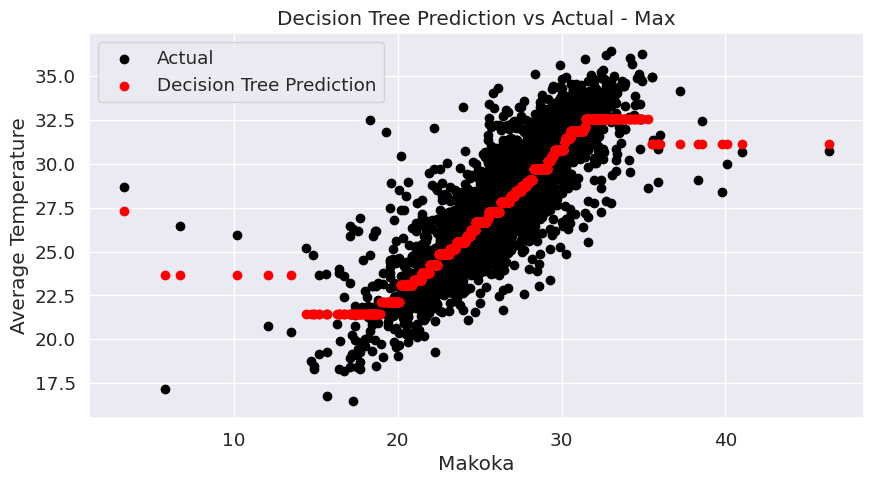

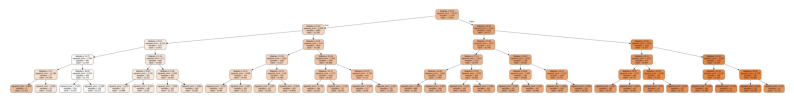

Linear Relationship Formula for Max: Average = 0.74 * Makoka + 8.30
Linear Relationship - Mean Absolute Error (MAE) for Max: 1.45
Linear Relationship - Mean Squared Error (MSE) for Max: 3.76
Linear Relationship - Root Mean Squared Error (RMSE) for Max: 1.94


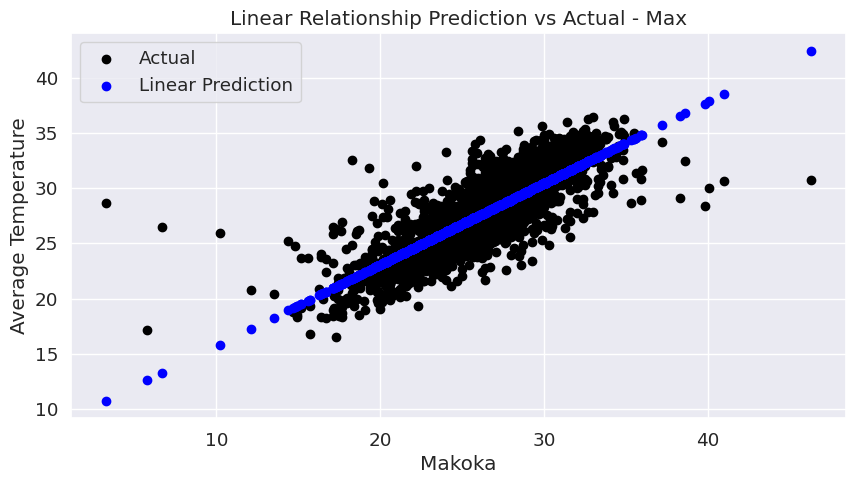

Non-linear Relationship Formula for Max: Average = 0.00 * Makoka^0 + 0.46 * Makoka^1 + 0.01 * Makoka^2 
Non-linear Relationship - Mean Absolute Error (MAE) for Max: 1.44
Non-linear Relationship - Mean Squared Error (MSE) for Max: 3.73
Non-linear Relationship - Root Mean Squared Error (RMSE) for Max: 1.93


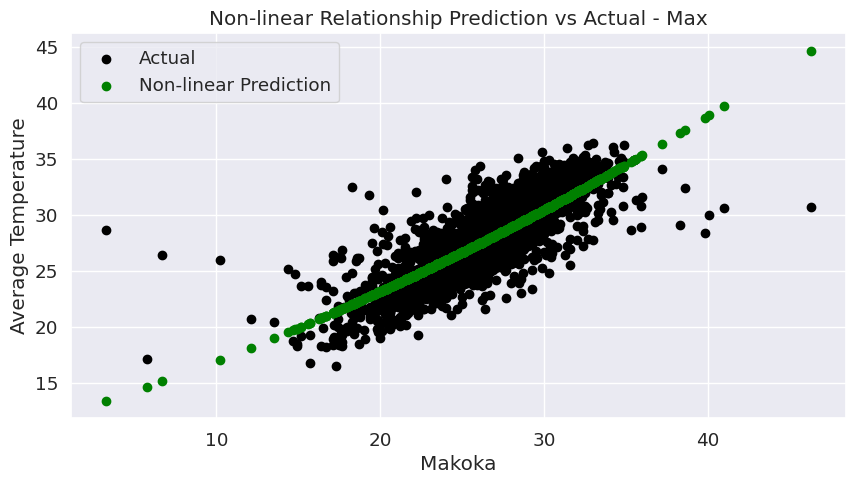


All outputs saved successfully for Max.

Decision Tree - Mean Absolute Error (MAE) for Min: 0.97
Decision Tree - Mean Squared Error (MSE) for Min: 1.68
Decision Tree - Root Mean Squared Error (RMSE) for Min: 1.30


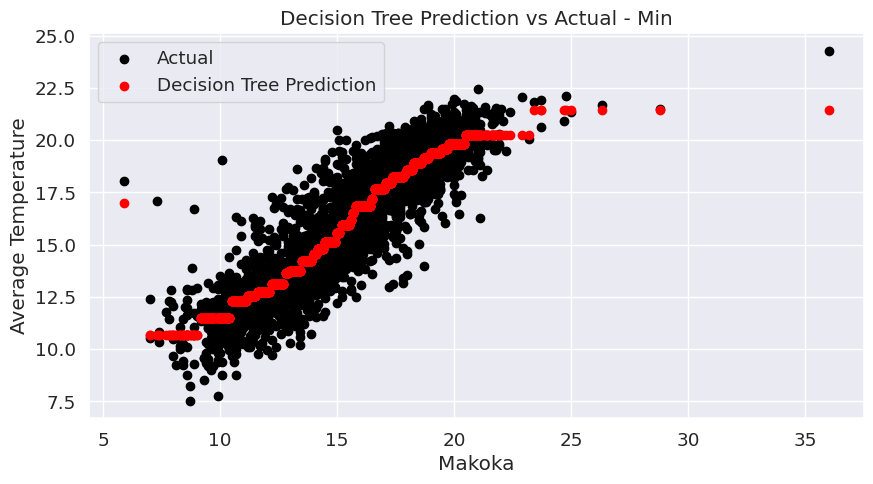

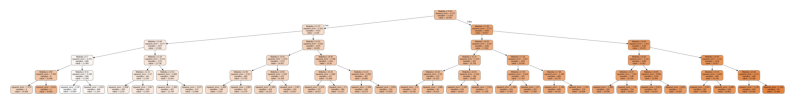

Linear Relationship Formula for Min: Average = 0.84 * Makoka + 3.10
Linear Relationship - Mean Absolute Error (MAE) for Min: 1.04
Linear Relationship - Mean Squared Error (MSE) for Min: 1.86
Linear Relationship - Root Mean Squared Error (RMSE) for Min: 1.37


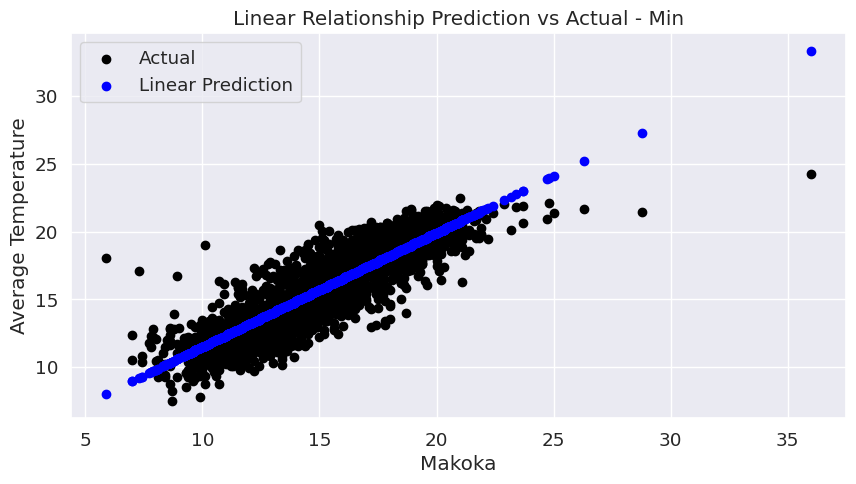

Non-linear Relationship Formula for Min: Average = 0.00 * Makoka^0 + 1.12 * Makoka^1 + -0.01 * Makoka^2 
Non-linear Relationship - Mean Absolute Error (MAE) for Min: 1.03
Non-linear Relationship - Mean Squared Error (MSE) for Min: 1.85
Non-linear Relationship - Root Mean Squared Error (RMSE) for Min: 1.36


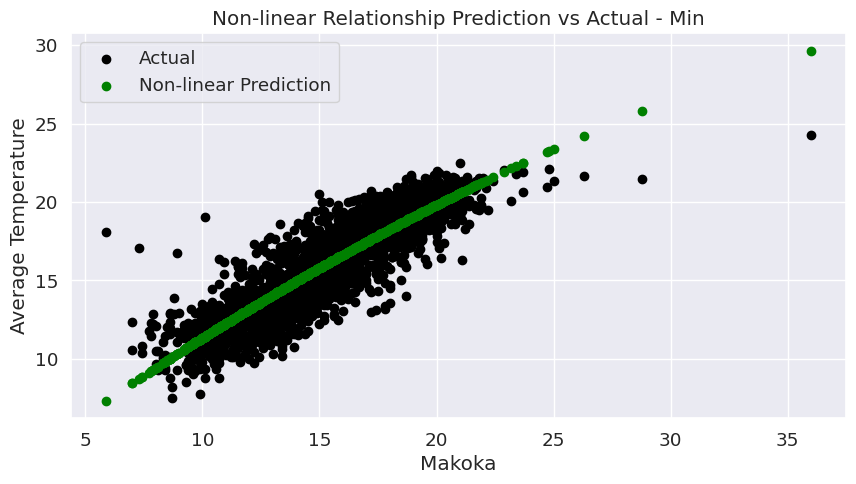


All outputs saved successfully for Min.

Decision Tree - Mean Absolute Error (MAE) for Mean: 0.93
Decision Tree - Mean Squared Error (MSE) for Mean: 1.50
Decision Tree - Root Mean Squared Error (RMSE) for Mean: 1.22


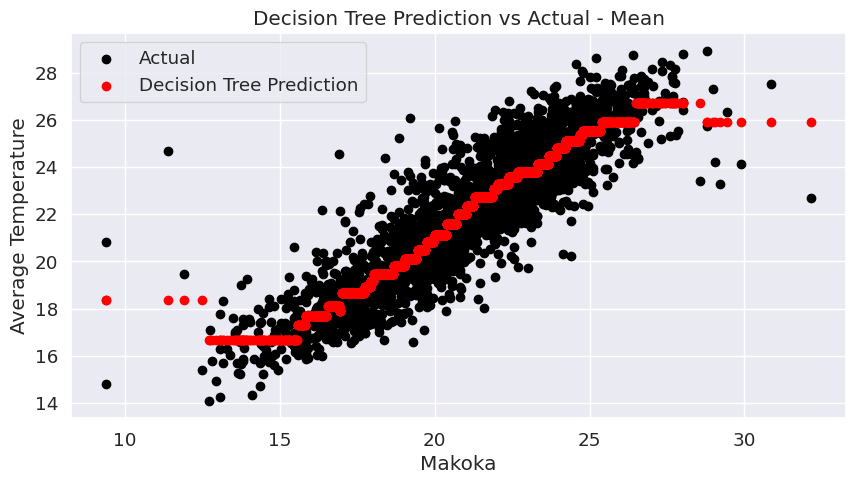

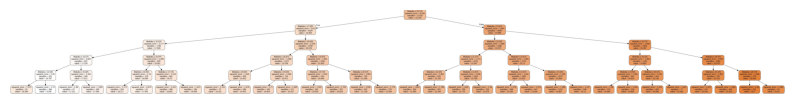

Linear Relationship Formula for Mean: Average = 0.85 * Makoka + 4.11
Linear Relationship - Mean Absolute Error (MAE) for Mean: 0.95
Linear Relationship - Mean Squared Error (MSE) for Mean: 1.62
Linear Relationship - Root Mean Squared Error (RMSE) for Mean: 1.27


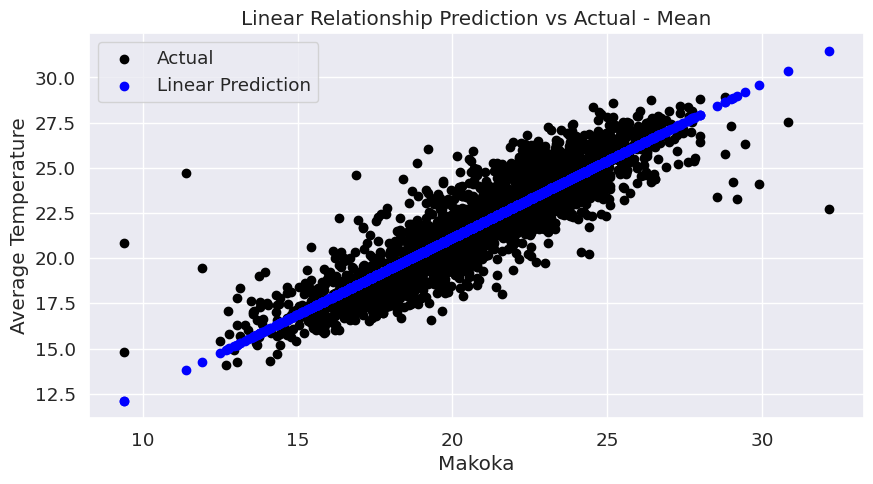

Non-linear Relationship Formula for Mean: Average = 0.00 * Makoka^0 + 0.91 * Makoka^1 + -0.00 * Makoka^2 
Non-linear Relationship - Mean Absolute Error (MAE) for Mean: 0.96
Non-linear Relationship - Mean Squared Error (MSE) for Mean: 1.62
Non-linear Relationship - Root Mean Squared Error (RMSE) for Mean: 1.27


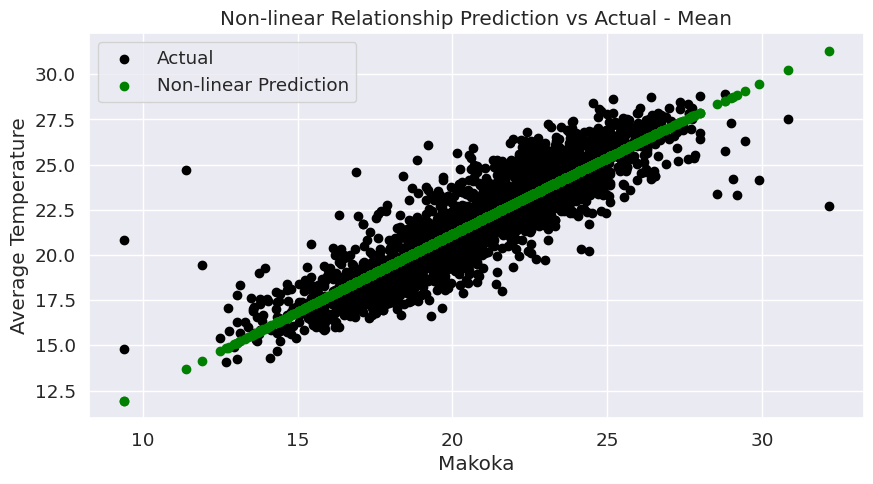


All outputs saved successfully for Mean.



In [42]:
import os
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor, export_text, export_graphviz
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn import metrics
import matplotlib.pyplot as plt
import seaborn as sns
import graphviz

# Create a folder to store the results
output_folder_path = '/content/MonthlyFromDailyTemperature'
os.makedirs(output_folder_path, exist_ok=True)

# Assuming 'dataTemp_dict' is defined and contains the temperature datasets (Min, Max, Mean)
for sheet_name, sheet_data in dataTemp_dict.items():
    # Check if the 'Date' is part of the index
    if 'Date' in sheet_data.index.names:
        # Features (X) and target variable (y)
        features = ['Makoka']
        target = 'Average'

        # Select relevant columns
        dataTree = sheet_data[features + [target]]

        # Prepare data
        X = dataTree[features]
        y = dataTree[target]

        # Split the data into training and testing sets
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

        # Build Decision Tree model with trial and error for better accuracy
        # You can experiment with different hyperparameters
        dt_model = DecisionTreeRegressor(max_depth=5, min_samples_split=5, random_state=42)
        dt_model.fit(X_train, y_train)

        # Predictions
        y_pred_tree = dt_model.predict(X_test)

        # Evaluate the Decision Tree model
        mae_tree = metrics.mean_absolute_error(y_test, y_pred_tree)
        mse_tree = metrics.mean_squared_error(y_test, y_pred_tree)
        rmse_tree = metrics.mean_squared_error(y_test, y_pred_tree, squared=False)

        # Display evaluation metrics for Decision Tree
        print(f'Decision Tree - Mean Absolute Error (MAE) for {sheet_name}: {mae_tree:.2f}')
        print(f'Decision Tree - Mean Squared Error (MSE) for {sheet_name}: {mse_tree:.2f}')
        print(f'Decision Tree - Root Mean Squared Error (RMSE) for {sheet_name}: {rmse_tree:.2f}')

        # Plot Decision Tree Prediction vs Actual
        plt.figure(figsize=(10, 5))
        plt.scatter(X_test, y_test, color='black', label='Actual')
        plt.scatter(X_test, y_pred_tree, color='red', label='Decision Tree Prediction')
        plt.title(f'Decision Tree Prediction vs Actual - {sheet_name}')
        plt.xlabel('Makoka')
        plt.ylabel('Average Temperature')
        plt.legend()
        plt.show()

        # Export the Decision Tree to a Graphviz file
        dot_data = export_graphviz(dt_model, out_file=None, feature_names=features, filled=True, rounded=True, special_characters=True)
        graph = graphviz.Source(dot_data)
        graph.render(f'{output_folder_path}/MonthlyFromDailyTemperature_decision_tree_{sheet_name.lower().replace(" ", "_")}', format='jpg', cleanup=True)

        # Display the Decision Tree
        plt.figure(figsize=(10, 5))
        img = plt.imread(f'{output_folder_path}/MonthlyFromDailyTemperature_decision_tree_{sheet_name.lower().replace(" ", "_")}.jpg')
        plt.imshow(img)
        plt.axis('off')
        plt.show()

        # Linear Relationship
        X_linear = dataTree[['Makoka']]
        y_linear = dataTree['Average']
        linear_model = LinearRegression()
        linear_model.fit(X_linear, y_linear)
        slope_linear = linear_model.coef_[0]
        intercept_linear = linear_model.intercept_
        linear_formula = f'Average = {slope_linear:.2f} * Makoka + {intercept_linear:.2f}'
        print(f"Linear Relationship Formula for {sheet_name}: {linear_formula}")

        # Predictions for Linear Relationship
        y_pred_linear = linear_model.predict(X_test)

        # Evaluate the Linear model
        mae_linear = metrics.mean_absolute_error(y_test, y_pred_linear)
        mse_linear = metrics.mean_squared_error(y_test, y_pred_linear)
        rmse_linear = metrics.mean_squared_error(y_test, y_pred_linear, squared=False)

        # Display evaluation metrics for Linear Relationship
        print(f'Linear Relationship - Mean Absolute Error (MAE) for {sheet_name}: {mae_linear:.2f}')
        print(f'Linear Relationship - Mean Squared Error (MSE) for {sheet_name}: {mse_linear:.2f}')
        print(f'Linear Relationship - Root Mean Squared Error (RMSE) for {sheet_name}: {rmse_linear:.2f}')

        # Plot Linear Relationship Prediction vs Actual
        plt.figure(figsize=(10, 5))
        plt.scatter(X_test, y_test, color='black', label='Actual')
        plt.scatter(X_test, y_pred_linear, color='blue', label='Linear Prediction')
        plt.title(f'Linear Relationship Prediction vs Actual - {sheet_name}')
        plt.xlabel('Makoka')
        plt.ylabel('Average Temperature')
        plt.legend()
        plt.show()

        # Non-linear Relationship (Polynomial Regression)
        degree = 2  # You can adjust the degree of the polynomial
        nonlinear_model = make_pipeline(PolynomialFeatures(degree), LinearRegression())
        nonlinear_model.fit(X, y)
        coefficients_nonlinear = nonlinear_model.named_steps['linearregression'].coef_
        intercept_nonlinear = nonlinear_model.named_steps['linearregression'].intercept_
        nonlinear_formula = 'Average = '
        for i in range(degree + 1):
            nonlinear_formula += f'{coefficients_nonlinear[i]:.2f} * Makoka^{i} + '
        nonlinear_formula = nonlinear_formula[:-2]  # Remove the trailing '+'
        print(f"Non-linear Relationship Formula for {sheet_name}: {nonlinear_formula}")

        # Predictions for Non-linear Relationship
        y_pred_nonlinear = nonlinear_model.predict(X_test)

        # Evaluate the Non-linear model
        mae_nonlinear = metrics.mean_absolute_error(y_test, y_pred_nonlinear)
        mse_nonlinear = metrics.mean_squared_error(y_test, y_pred_nonlinear)
        rmse_nonlinear = metrics.mean_squared_error(y_test, y_pred_nonlinear, squared=False)

        # Display evaluation metrics for Non-linear Relationship
        print(f'Non-linear Relationship - Mean Absolute Error (MAE) for {sheet_name}: {mae_nonlinear:.2f}')
        print(f'Non-linear Relationship - Mean Squared Error (MSE) for {sheet_name}: {mse_nonlinear:.2f}')
        print(f'Non-linear Relationship - Root Mean Squared Error (RMSE) for {sheet_name}: {rmse_nonlinear:.2f}')

        # Plot Non-linear Relationship Prediction vs Actual
        plt.figure(figsize=(10, 5))
        plt.scatter(X_test, y_test, color='black', label='Actual')
        plt.scatter(X_test, y_pred_nonlinear, color='green', label='Non-linear Prediction')
        plt.title(f'Non-linear Relationship Prediction vs Actual - {sheet_name}')
        plt.xlabel('Makoka')
        plt.ylabel('Average Temperature')
        plt.legend()
        plt.show()

        # Save the model predictions with a meaningful name
        predictions_df = pd.DataFrame({'Actual': y_test, 'DecisionTree_Predicted': y_pred_tree,
                                       'Linear_Predicted': y_pred_linear, 'Nonlinear_Predicted': y_pred_nonlinear})
        predictions_df.to_excel(f'{output_folder_path}/MonthlyFromDailyTemperature_model_predictions_and_errors_{sheet_name.lower().replace(" ", "_")}.xlsx', index=False)

        # Save feature importances with a meaningful name
        feature_importances = pd.DataFrame({'Feature': features, 'Importance': dt_model.feature_importances_})
        feature_importances.to_excel(f'{output_folder_path}/MonthlyFromDailyTemperature_eature_importances_{sheet_name.lower().replace(" ", "_")}.xlsx', index=False)

        # Generate rules from the Decision Tree and save with a meaningful name
        tree_rules = export_text(dt_model, feature_names=features)
        with open(f'{output_folder_path}/MonthlyFromDailyTemperature_decision_tree_rules_{sheet_name.lower().replace(" ", "_")}.txt', 'w') as f:
            f.write(tree_rules)

        print(f"\nAll outputs saved successfully for {sheet_name}.\n{'='*50}\n")
    else:
        print(f"\nError: 'Date' not part of the index in the {sheet_name} dataset.\n{'='*50}\n")

### 2.2.4. Calculate Monthly Temprature Anomaly

In [43]:
import os
import pandas as pd

# Install xlsxwriter if not installed
# !pip install xlsxwriter -q

# Replace the URL with the actual path to your Excel file
url = 'https://github.com/mtofighi/ChilwaBasin/blob/main/ChilwaBasin_ClimateDailyAnalysis_032024/Data/ChilwaBasin_Temperature_19812018.xlsx?raw=true'

# Read all sheets of the Excel file
dataTemp_dict = pd.read_excel(url, sheet_name=None)

# Create a folder to store the results
output_folder_path = '/content/MonthlyFromDailyTemperature'
os.makedirs(output_folder_path, exist_ok=True)

# Create an Excel writer object
with pd.ExcelWriter('MonthlyFromDailyTemperature_anomaly_results.xlsx', engine='xlsxwriter') as writer:
    # Assuming 'dataTemp_dict' is defined and contains the temperature datasets (Min, Max, Mean)
    for sheet_name, dataset in dataTemp_dict.items():
        # Check if the 'Date' column is present in the dataset
        if 'Date' in dataset.columns:
            # Convert the 'Date' column to datetime type
            dataset['Date'] = pd.to_datetime(dataset['Date'])

            # Resample the data to monthly frequency, taking the first day of each month
            monthly_dataset = dataset.resample('MS', on='Date').mean()

            # Calculate the monthly anomaly of average temperature
            monthly_dataset['Anomaly'] = monthly_dataset['Average'] - monthly_dataset['Average'].mean()

            # Calculate the standard deviation
            std_deviation = monthly_dataset['Average'].std()

            # Calculate the standardized monthly anomaly
            monthly_dataset['Standardized Anomaly'] = monthly_dataset['Anomaly'] / std_deviation

            # Reset the index to have a default integer index
            monthly_dataset.reset_index(inplace=True)

            # Format the 'Date' column as 2/1/2000
            monthly_dataset['Date'] = monthly_dataset['Date'].dt.strftime('%m/%d/%Y')

            # Save the monthly dataset to the Excel file with a proper sheet name
            sheet_name_cleaned = sheet_name.lower().replace(' ', '_')
            monthly_dataset[['Date', 'Chanco', 'Chingale', 'Makoka', 'Naminjiwa', 'Ntaja', 'Zomba_RTC', 'Average', 'Anomaly', 'Standardized Anomaly']].to_excel(writer, sheet_name=sheet_name_cleaned, index=False)

            # Print the first few rows of the DataFrame with the new columns
            print(f"\nMonthly Anomaly Data - {sheet_name}:\n{monthly_dataset.head()}\n{'='*50}\n")
        else:
            print(f"\nError: 'Date' column not found in the {sheet_name} dataset.\n{'='*50}\n")

# Print a final message
print(f'All outputs saved to temperature_anomaly_results.xlsx\n{"="*50}\n')



Monthly Anomaly Data - Max:
         Date     Chanco   Chingale     Makoka  Naminjiwa      Ntaja  \
0  01/01/1981  28.035484  33.425806  27.370968  29.548387  29.464516   
1  02/01/1981  28.271429  31.067857  26.617857  26.503571  28.071429   
2  03/01/1981  26.854839  28.932258  26.187097  25.106452  28.929032   
3  04/01/1981  25.916667  28.133333  24.846667  24.046667  26.846667   
4  05/01/1981  25.570968  26.548387  22.767742  21.858065  26.335484   

   Zomba_RTC    Average   Anomaly  Standardized Anomaly  
0  31.583871  29.904839  2.066621              0.790318  
1  28.982143  28.252381  0.414164              0.158385  
2  27.219355  27.204839 -0.633379             -0.242217  
3  26.510000  26.050000 -1.788217             -0.683851  
4  24.635484  24.619355 -3.218863             -1.230959  


Monthly Anomaly Data - Min:
         Date     Chanco   Chingale     Makoka  Naminjiwa      Ntaja  \
0  01/01/1981  18.312903  19.754839  18.912903  19.019355  19.616129   
1  02/01/1981  1

### 2.2.5. Monthly Temprature Average Statistics

In [45]:
import os
import pandas as pd

# Create a folder to store the results
output_folder_path = '/content/MonthlyFromDailyTemperature'
os.makedirs(output_folder_path, exist_ok=True)

# Create an empty DataFrame to store the combined data
combined_statistics = pd.DataFrame()

# Define the correct order of months
correct_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']

# Assuming dataTemp_dict is defined and contains the temperature datasets (Min, Max, Mean)
for sheet_name, dataset in dataTemp_dict.items():
    # Check if the 'Date' column is present in the dataset
    if 'Date' in dataset.columns:
        # Extract relevant columns
        selected_columns = ['Date', 'Average']
        monthly_data = dataset[selected_columns]

        # Extract month from the 'Date' column
        monthly_data['Month'] = pd.to_datetime(monthly_data['Date']).dt.month_name()

        # Group by month and calculate statistics
        monthly_statistics = monthly_data.groupby('Month')['Average'].agg(['mean', 'max', 'min', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)])

        # Reorder the index to match the correct order of months
        monthly_statistics = monthly_statistics.reindex(correct_order)

        # Rename the columns
        monthly_statistics.columns = ['Mean', 'Max', 'Min', '25th Percentile', '75th Percentile']

        # Append the current sheet data to the combined DataFrame
        combined_statistics = pd.concat([combined_statistics, monthly_statistics], axis=1, keys=[sheet_name])

        # Display the monthly statistics
        print(f'\nMonthly Average Statistics - {sheet_name}:\n{monthly_statistics}\n{"="*50}\n')
    else:
        print(f"\nError: 'Date' column not found in the {sheet_name} dataset.\n{'='*50}\n")

# Save the combined statistics to an Excel file in the specified folder
combined_output_file_path = os.path.join(output_folder_path, 'MonthlyFromDailyTemperature_combined_monthly_average_statistics.xlsx')
combined_statistics.to_excel(combined_output_file_path)

print(f'Combined monthly statistics saved to {combined_output_file_path}\n{"="*50}\n')


Monthly Average Statistics - Max:
                Mean        Max        Min  25th Percentile  75th Percentile
Month                                                                       
January    28.691242  36.450000  21.733333        27.350000        30.066667
February   27.991100  36.450000  21.800000        26.833333        29.233333
March      27.845458  34.450000  21.383333        26.850000        28.983333
April      26.947266  32.366667  20.533333        25.666667        28.270833
May        25.975071  34.500000  16.566667        24.483333        27.445833
June       24.321506  31.650000  16.316667        22.979167        25.833333
July       23.851005  30.050000  16.500000        22.300000        25.579167
August     26.111241  31.633333  17.166667        24.804167        27.795833
September  29.403874  36.233333  19.250000        28.245833        30.950000
October    31.206225  36.500000  21.166667        30.150000        32.650000
November   31.691053  37.133333  20.08333

<ipython-input-45-400b28f87deb>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  monthly_data['Month'] = pd.to_datetime(monthly_data['Date']).dt.month_name()
<ipython-input-45-400b28f87deb>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  monthly_data['Month'] = pd.to_datetime(monthly_data['Date']).dt.month_name()
<ipython-input-45-400b28f87deb>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the c

### 2.2.6. Categorize Years of Cold/Warm/Normal Based on Monthly Temprature Average Statistics

In [55]:
import os
import pandas as pd
import numpy as np

# Assuming dataTemp_dict is defined and contains the temperature datasets (Min, Max, Mean)

# Create a folder to store the results
output_folder_path = '/content/MonthlyFromDailyTemperature'
os.makedirs(output_folder_path, exist_ok=True)

# Create an empty DataFrame to store the combined data
combined_category_monthly_stats = pd.DataFrame()

# Iterate through temperature datasets
for sheet_name, monthly_data in dataTemp_dict.items():
    # Check if the 'Date' column is present in the monthly_data
    if 'Date' in monthly_data.columns:
        # Extract relevant columns
        selected_columns = ['Date', 'Average']
        monthly_data = monthly_data[selected_columns]

        # Extract year from the 'Date' column
        monthly_data['Year'] = pd.to_datetime(monthly_data['Date']).dt.year

        # Categorize years as warm, cold, or normal based on average monthly temperature
        yearly_statistics = monthly_data.groupby('Year')['Average'].mean().reset_index()
        yearly_statistics.columns = ['Year', 'Yearly Average']

        conditions = [
            (yearly_statistics['Yearly Average'] > yearly_statistics['Yearly Average'].quantile(0.75)),
            (yearly_statistics['Yearly Average'] < yearly_statistics['Yearly Average'].quantile(0.25))
        ]

        choices = ['Warm', 'Cold']
        yearly_statistics['Category'] = np.select(conditions, choices, default='Normal')

        # Merge categories back to the monthly data
        monthly_data = pd.merge(monthly_data, yearly_statistics[['Year', 'Category']], on='Year', how='left')

        # Extract month from the 'Date' column
        monthly_data['Month'] = pd.to_datetime(monthly_data['Date']).dt.month_name()

        # Group by category and month, calculate the mean
        category_monthly_stats = monthly_data.groupby(['Category', 'Month'])['Average'].mean().reset_index()

        # Order months chronologically
        months_order = [
            'January', 'February', 'March', 'April', 'May', 'June',
            'July', 'August', 'September', 'October', 'November', 'December'
        ]

        category_monthly_stats['Month'] = pd.Categorical(category_monthly_stats['Month'], categories=months_order, ordered=True)
        category_monthly_stats = category_monthly_stats.sort_values(['Category', 'Month'])

        # Append the current sheet data to the combined DataFrame
        combined_category_monthly_stats = pd.concat([combined_category_monthly_stats, category_monthly_stats], axis=1, keys=[sheet_name])

        # Display the results
        print(f"\n{sheet_name} - Years and Categories:")
        print(monthly_data[['Year', 'Category']].drop_duplicates().sort_values(by=['Year']))

        print(f"\n{sheet_name} - Category Monthly Statistics:")
        print(category_monthly_stats)

        print("=" * 50)
    else:
        print(f"\nError: 'Date' column not found in the {sheet_name} dataset.\n{'='*50}\n")

# Reset the MultiIndex
combined_category_monthly_stats.columns = combined_category_monthly_stats.columns.map('_'.join).str.strip('_')

# Identify the most warm and cold years
most_warm_year = yearly_statistics.loc[yearly_statistics['Category'] == 'Warm', 'Yearly Average'].idxmax()
most_cold_year = yearly_statistics.loc[yearly_statistics['Category'] == 'Cold', 'Yearly Average'].idxmin()

# Display the monthly data for the most warm and cold years
most_warm_data = monthly_data[monthly_data['Year'] == yearly_statistics.loc[most_warm_year, 'Year']]
most_cold_data = monthly_data[monthly_data['Year'] == yearly_statistics.loc[most_cold_year, 'Year']]

# Create an Excel file and save the data in separate sheets in the specified folder
output_file_path = os.path.join(output_folder_path, 'MonthlyFromDailyTemperature_Extreme_analysis_results.xlsx')
with pd.ExcelWriter(output_file_path, engine='xlsxwriter') as writer:
    yearly_statistics.to_excel(writer, sheet_name='Yearly Statistics', index=False)
    category_monthly_stats.to_excel(writer, sheet_name='Monthly Statistics by Category', index=False)
    most_warm_data.to_excel(writer, sheet_name='Most Warm Year Data', index=False)
    most_cold_data.to_excel(writer, sheet_name='Most Cold Year Data', index=False)

# Provide an explanation of the calculation
explanation = (
    "Calculation Explanation:\n\n"
    "1. Yearly Statistics:\n"
    "   - Calculate the average monthly temperature for each year.\n"
    "   - Categorize years as Warm, Cold, or Normal based on quantiles (25th and 75th percentiles).\n\n"
    "2. Monthly Statistics by Category:\n"
    "   - Group data by Category (Warm, Cold, Normal) and Month.\n"
    "   - Calculate the average monthly temperature for each category and month.\n\n"
    "3. Most Warm and Cold Year Data:\n"
    "   - Identify the most warm and cold years based on category.\n"
    "   - Extract the monthly data for the most warm and cold years.\n"
    "   - Create an Excel file with separate sheets for each type of data."
)

# Save the explanation in a text file in the specified folder
explanation_file_path = os.path.join(output_folder_path, 'MonthlyFromDailyTemperature_calculation_explanation.txt')
with open(explanation_file_path, 'w') as f:
    f.write(explanation)

print(f'Combined category monthly statistics and explanation saved to {output_file_path} and {explanation_file_path}\n{"="*50}\n')

<ipython-input-55-cb0ff4c109c8>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  monthly_data['Year'] = pd.to_datetime(monthly_data['Date']).dt.year
<ipython-input-55-cb0ff4c109c8>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  monthly_data['Year'] = pd.to_datetime(monthly_data['Date']).dt.year
<ipython-input-55-cb0ff4c109c8>:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the docu


Max - Years and Categories:
       Year Category
0      1981     Cold
365    1982     Cold
730    1983     Warm
1095   1984     Cold
1461   1985     Cold
1826   1986     Cold
2191   1987   Normal
2556   1988   Normal
2922   1989     Cold
3287   1990   Normal
3652   1991   Normal
4017   1992     Warm
4383   1993   Normal
4748   1994     Warm
5113   1995     Warm
5478   1996     Cold
5844   1997     Cold
6209   1998     Warm
6574   1999     Cold
6939   2000   Normal
7305   2001     Warm
7670   2002     Warm
8035   2003   Normal
8400   2004   Normal
8766   2005     Warm
9131   2006   Normal
9496   2007   Normal
9861   2008   Normal
10227  2009   Normal
10592  2010     Warm
10957  2011   Normal
11322  2012   Normal
11688  2013   Normal
12053  2014     Cold
12418  2015   Normal
12783  2016   Normal
13149  2017   Normal
13514  2018     Warm

Max - Category Monthly Statistics:
   Category      Month    Average
4      Cold    January  28.172527
3      Cold   February  26.771927
7      Cold   

https://chat.openai.com/share/d6c66a48-e1b8-4417-b8cc-056e50f24076

# **3. Upload Results on Google Drive**

In [63]:
from google.colab import auth
from googleapiclient.discovery import build
from googleapiclient.http import MediaFileUpload
import os
import datetime

# Authenticate and create the service
auth.authenticate_user()
drive_service = build('drive', 'v3')

# Create a folder with a unique name based on the current date and time
folder_name = f"plots_{datetime.datetime.now().strftime('%Y%m%d_%H%M%S')}"
folder_metadata = {
    'name': folder_name,
    'mimeType': 'application/vnd.google-apps.folder'
}
folder = drive_service.files().create(body=folder_metadata, fields='id').execute()
folder_id = folder.get('id')

# Folder path containing the images
# image_folder_path = '/content/DailyRainfall/'
# image_folder_path = '/content/MonthlyFromDailyRainfall/'
# image_folder_path = '/content/MonthlyRainfall/'

# image_folder_path = '/content/DailyTemperature/'
image_folder_path = '/content/MonthlyFromDailyTemperature/'


# List all files in the image folder
image_files = [f for f in os.listdir(image_folder_path) if os.path.isfile(os.path.join(image_folder_path, f))]

# Upload each image file to the specified folder
for image_file in image_files:
    file_metadata = {
        'name': image_file,
        'parents': [folder_id]  # Specify the folder ID as the parent
    }
    media = MediaFileUpload(os.path.join(image_folder_path, image_file), resumable=True)
    file = drive_service.files().create(body=file_metadata, media_body=media, fields='id').execute()
    print('Uploaded:', image_file)  # Print the name of the image file

Uploaded: MonthlyFromDailyTemperature_calculation_explanation.txt
Uploaded: MonthlyFromDailyTemperature_correlation_heatmap_mean.jpg
Uploaded: MonthlyFromDailyTemperature_model_predictions_and_errors_max.xlsx
Uploaded: MonthlyFromDailyTemperature_eature_importances_min.xlsx
Uploaded: MonthlyFromDailyTemperature_combined_category_monthly_stats_ordered.xlsx
Uploaded: MonthlyFromDailyTemperature_decision_tree_min.jpg
Uploaded: MonthlyFromDailyTemperature_decision_tree_rules_min.txt
Uploaded: MonthlyFromDailyTemperature_model_predictions_and_errors_mean.xlsx
Uploaded: MonthlyFromDailyTemperature_model_predictions_and_errors_min.xlsx
Uploaded: MonthlyFromDailyTemperature_eature_importances_mean.xlsx
Uploaded: MonthlyFromDailyTemperature_Extreme_analysis_results.xlsx
Uploaded: MonthlyFromDailyTemperature_eature_importances_max.xlsx
Uploaded: MonthlyFromDailyTemperature_combined_monthly_average_statistics.xlsx
Uploaded: MonthlyFromDailyTemperature_correlation_matrix_datasets.xlsx
Uploaded: Mo

# **4. Links**

https://chat.openai.com/share/d6c66a48-e1b8-4417-b8cc-056e50f24076

https://drive.google.com/drive/u/0/folders/1_8gxYEqh0DEwwetAoTQF7BOkZ6iuvPR-